<a href="https://colab.research.google.com/github/ResponsiveWebApps/Covid-data-science/blob/main/CovidByCountry.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Importing modules**

In [1]:
import pandas as pd
import seaborn as sns
import plotly
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
import random

**Importing data**

In [2]:
# Mount Google drive and data
from google.colab import drive
drive.mount('/content/drive')



Mounted at /content/drive


In [3]:

covid_df = pd.read_csv("/content/drive/My Drive/Colab Notebooks/COVID/Data/owid-covid-data.csv")

In [4]:
ire_vax_df = pd.read_csv("/content/drive/My Drive/Colab Notebooks/COVID/Data/Ireland_vaccinations.csv")

**Initial data exploration**

In [5]:
covid_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 138491 entries, 0 to 138490
Data columns (total 67 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   iso_code                                    138491 non-null  object 
 1   continent                                   129679 non-null  object 
 2   location                                    138491 non-null  object 
 3   date                                        138491 non-null  object 
 4   total_cases                                 130792 non-null  float64
 5   new_cases                                   130787 non-null  float64
 6   new_cases_smoothed                          129747 non-null  float64
 7   total_deaths                                119467 non-null  float64
 8   new_deaths                                  119663 non-null  float64
 9   new_deaths_smoothed                         129747 non-null  float64
 

In [6]:
covid_df = covid_df.sort_values(by='date')
covid_df

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
4831,ARG,South America,Argentina,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,4.0,0.000,0.000,NaN,NaN,NaN,NaN,tests performed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,45605823.0,16.177,31.9,11.198,7.441,18933.907,0.6,191.032,5.50,16.2,27.7,NaN,5.00,76.67,0.845,NaN,NaN,NaN,NaN
80827,MEX,North America,Mexico,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25.0,25.0,0.000,0.000,NaN,NaN,NaN,NaN,people tested,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,130262220.0,66.444,29.3,6.857,4.321,17336.469,2.5,152.783,13.06,6.9,21.4,87.847,1.38,75.05,0.779,NaN,NaN,NaN,NaN
98578,PER,South America,Peru,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,2.0,0.000,0.000,NaN,NaN,NaN,NaN,tests performed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,33359415.0,25.129,29.1,7.151,4.455,12236.706,3.5,85.755,5.95,4.8,NaN,NaN,1.60,76.74,0.777,NaN,NaN,NaN,NaN
80828,MEX,North America,Mexico,2020-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,72.0,97.0,0.001,0.001,NaN,NaN,NaN,NaN,people tested,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,130262220.0,66.444,29.3,6.857,4.321,17336.469,2.5,152.783,13.06,6.9,21.4,87.847,1.38,75.05,0.779,NaN,NaN,NaN,NaN
98579,PER,South America,Peru,2020-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tests performed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,33359415.0,25.129,29.1,7.151,4.455,12236.706,3.5,85.755,5.95,4.8,NaN,NaN,1.60,76.74,0.777,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69882,LBN,Asia,Lebanon,2021-12-07,681332.0,1707.0,1525.143,8795.0,10.0,10.000,100652.504,252.173,225.308,1299.277,1.477,1.477,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3692973.0,1970474.0,1722499.0,NaN,14443.0,13098.0,54.56,29.11,25.45,NaN,1935.0,7918.0,0.117,NaN,6769151.0,594.561,31.1,8.514,5.430,13367.565,NaN,266.591,12.71,26.9,40.7,NaN,2.90,78.93,0.744,NaN,NaN,NaN,NaN
81854,FSM,Oceania,Micronesia (country),2021-12-07,1.0,0.0,0.000,NaN,NaN,0.000,8.602,0.000,0.000,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [7]:
# Checking for missing values.
covid_df.isna().sum() 

iso_code                                        0
continent                                    8812
location                                        0
date                                            0
total_cases                                  7699
                                            ...  
human_development_index                     18803
excess_mortality_cumulative_absolute       133597
excess_mortality_cumulative                133597
excess_mortality                           133597
excess_mortality_cumulative_per_million    133597
Length: 67, dtype: int64

**New covid deaths By Country**

In [8]:
maxNewDeaths = covid_df["new_deaths"].max()
maxNewDeaths

18007.0

In [9]:
# Create figure
fig = px.choropleth(
                    covid_df, 
                    locations = covid_df['location'],
                    locationmode = 'country names',
                    color='new_deaths', 
                    range_color=[0,18000],
                    hover_name='location', 
                    animation_frame='date',
                    color_continuous_scale=px.colors.sequential.Bluered
                   )

fig.update_layout(
    title_text = 'New covid deaths By Country',
    geo = dict(projection={'type':'natural earth'})
)
  
fig.show()

**Covid cases by country**

We took the data from Our World In Data to conduct a preliminary data exploration of covid cases for each country. The corralation matrix provides interesting incites into which features have an effect on covid cases and deaths. The multi-billino dollar question is "do vaccinations stop the spread of covid?"

The data science provided is the first step in our major exploration. The maths involved maybe faulty due to missing values and bad data. For our final project extensive data cleaning is needed. The tables and visualisations shown here should be considered as an indication as opposed to being the final calculations. Further research is needed into the efecatiousness of vaccines for particular ages, demographiec and various 'vunerbale' categories.  

**Dropping coloumns**

In [10]:
# New deaths
#new_deaths_df = covid_df.drop(covid_df.columns[[0, 1, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33]], axis=1)
#new_deaths_df

In [11]:
# Deaths per million
deaths_df = covid_df.drop(covid_df.columns[[0, 1, 4, 5, 6, 7, 8, 9, 10, 13, 16, 17, 21, 22, 23, 24, 25, 26, 27, 29, 32, 33, 34, 35, 36, 38, 40, 45, 47, 49, 50, 53, 54, 55 ]], axis=1)
deaths_df

,location,date,new_cases_per_million,new_cases_smoothed_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,icu_patients_per_million,hosp_patients,hosp_patients_per_million,new_tests_per_thousand,new_tests_smoothed_per_thousand,positive_rate,total_boosters,new_vaccinations_smoothed,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed_per_hundred,population,aged_65_older,aged_70_older,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
4831,Argentina,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45605823.0,11.198,7.441,5.50,16.2,27.7,NaN,5.00,76.67,0.845,NaN,NaN,NaN,NaN
80827,Mexico,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,130262220.0,6.857,4.321,13.06,6.9,21.4,87.847,1.38,75.05,0.779,NaN,NaN,NaN,NaN
98578,Peru,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,33359415.0,7.151,4.455,5.95,4.8,NaN,NaN,1.60,76.74,0.777,NaN,NaN,NaN,NaN
80828,Mexico,2020-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,130262220.0,6.857,4.321,13.06,6.9,21.4,87.847,1.38,75.05,0.779,NaN,NaN,NaN,NaN
98579,Peru,2020-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,33359415.0,7.151,4.455,5.95,4.8,NaN,NaN,1.60,76.74,0.777,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69882,Lebanon,2021-12-07,252.173,225.308,1.477,1.477,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13098.0,29.11,25.45,NaN,1935.0,0.117,6769151.0,8.514,5.430,12.71,26.9,40.7,NaN,2.90,78.93,0.744,NaN,NaN,NaN,NaN
81854,Micronesia (country),2021-12-07,0.000,0.000,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,116255.0,4.810,2.392,12.02,NaN,NaN,NaN,NaN,67.88,0.620,NaN,NaN,NaN,NaN
34903,Dominica,2021-12-07,0.000,114.805,0.000,7.918,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,72172.0,NaN,NaN,11.62,NaN,NaN,NaN,3.80,75.00,0.742,NaN,NaN,NaN,NaN
83142,Monaco,2021-12-07,1012.146,737.420,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,39520.0,NaN,NaN,5.46,NaN,NaN,NaN,13.80,86.75,NaN,NaN,NaN,NaN,NaN



**Coralations**



In [12]:
# Exporing the numeric values of our dataset
deaths_df_numeric = deaths_df.select_dtypes(include=['float64', 'int64'])
deaths_df_numeric.head()

,new_cases_per_million,new_cases_smoothed_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,icu_patients_per_million,hosp_patients,hosp_patients_per_million,new_tests_per_thousand,new_tests_smoothed_per_thousand,positive_rate,total_boosters,new_vaccinations_smoothed,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed_per_hundred,population,aged_65_older,aged_70_older,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
4831,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45605823.0,11.198,7.441,5.50,16.2,27.7,NaN,5.00,76.67,0.845,NaN,NaN,NaN,NaN
80827,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,130262220.0,6.857,4.321,13.06,6.9,21.4,87.847,1.38,75.05,0.779,NaN,NaN,NaN,NaN
98578,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,33359415.0,7.151,4.455,5.95,4.8,NaN,NaN,1.60,76.74,0.777,NaN,NaN,NaN,NaN
80828,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,130262220.0,6.857,4.321,13.06,6.9,21.4,87.847,1.38,75.05,0.779,NaN,NaN,NaN,NaN
98579,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,33359415.0,7.151,4.455,5.95,4.8,NaN,NaN,1.60,76.74,0.777,NaN,NaN,NaN,NaN


In [13]:
# correlation matrix
cor = deaths_df_numeric.corr()
cor

,new_cases_per_million,new_cases_smoothed_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,icu_patients_per_million,hosp_patients,hosp_patients_per_million,new_tests_per_thousand,new_tests_smoothed_per_thousand,positive_rate,total_boosters,new_vaccinations_smoothed,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed_per_hundred,population,aged_65_older,aged_70_older,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
new_cases_per_million,1.000000,0.851131,0.525562,0.516477,0.518080,1.728163e-01,5.409968e-01,0.288020,0.294625,0.306751,-0.021772,-0.044534,0.110763,0.120738,0.169840,0.120755,0.082708,-0.040412,0.265762,0.263386,0.025221,0.274021,0.081364,2.833115e-01,0.164386,0.246851,0.281609,0.034423,0.107776,0.322037,0.185294
new_cases_smoothed_per_million,0.851131,1.000000,0.512649,0.632432,0.621135,2.026114e-01,6.452392e-01,0.306717,0.337222,0.349113,-0.025392,-0.051832,0.119798,0.128900,0.208655,0.148419,0.103366,-0.047569,0.299646,0.297604,0.031059,0.310773,0.093299,3.206989e-01,0.189691,0.290547,0.327365,0.047903,0.088762,0.343207,0.211081
new_deaths_per_million,0.525562,0.512649,1.000000,0.781984,0.744419,2.628240e-01,7.631597e-01,0.092831,0.094955,0.375326,-0.020715,-0.030716,-0.130868,-0.137710,0.007329,0.044079,0.063231,-0.031989,0.225528,0.223730,0.028872,0.247940,0.095003,2.515781e-01,0.125886,0.170008,0.204133,0.073321,0.342182,0.599920,0.294992
new_deaths_smoothed_per_million,0.516477,0.632432,0.781984,1.000000,0.828395,2.874820e-01,8.408160e-01,0.101491,0.114749,0.428092,-0.023526,-0.037030,-0.155634,-0.164815,-0.004175,0.059312,0.077925,-0.031645,0.279473,0.277122,0.008450,0.288440,0.091923,3.146085e-01,0.157251,0.215779,0.254380,0.145440,0.366209,0.667617,0.378552
icu_patients_per_million,0.518080,0.621135,0.744419,0.828395,1.000000,3.932905e-01,7.681715e-01,0.102703,0.086397,0.595305,0.082544,0.051791,-0.477684,-0.408735,0.012120,-0.132874,0.052437,0.138135,0.141728,0.146122,0.000683,0.233659,0.118583,6.270155e-01,0.272454,-0.080747,-0.008192,0.166787,0.410879,0.664506,0.353879
hosp_patients,0.172816,0.202611,0.262824,0.287482,0.393290,1.000000e+00,2.845040e-01,-0.039717,-0.042987,0.192513,0.429399,0.560392,-0.114980,-0.108684,-0.004900,-0.049155,0.022864,0.805225,-0.011973,-0.014693,0.169097,-0.006243,-0.078328,-3.540162e-16,-0.092503,-0.043195,0.017941,0.743476,0.314534,0.255106,0.177375
hosp_patients_per_million,0.540997,0.645239,0.763160,0.840816,0.768172,2.845040e-01,1.000000e+00,0.053928,0.049556,0.691584,0.037301,-0.052357,-0.446356,-0.368741,0.119666,-0.173661,-0.011572,0.016987,0.119635,0.141183,0.030579,0.318571,0.279952,9.451444e-16,0.337530,-0.356272,-0.382985,0.058146,0.422966,0.742451,0.433525
new_tests_per_thousand,0.288020,0.306717,0.092831,0.101491,0.102703,-3.971696e-02,5.392819e-02,1.000000,0.900352,-0.156807,-0.047064,-0.057242,0.163662,0.155744,0.048896,0.136045,0.074721,-0.065531,0.167305,0.170227,0.053452,0.201959,0.120833,1.165777e-01,0.106089,0.220933,0.257416,-0.047823,-0.048526,-0.013185,0.025338
new_tests_smoothed_per_thousand,0.294625,0.337222,0.094955,0.114749,0.086397,-4.298705e-02,4.955633e-02,0.900352,1.000000,-0.165215,-0.045971,-0.062006,0.188924,0.173636,0.078513,0.153486,0.080259,-0.076821,0.195406,0.194601,0.076735,0.216352,0.124338,3.377861e-01,0.099656,0.260537,0.298695,-0.057479,-0.070962,-0.025324,0.019335
positive_rate,0.306751,0.349113,0.375326,0.428092,0.595305,1.925125e-01,6.915844e-01,-0.156807,-0.165215,1.000000,0.024989,-0.044122,-0.248113,-0.238665,0.016743,-0.091910,-0.030039,-0.016344,-0.136730,-0.142853,0.052613,-0.073055,-0.036766,1.649106e-01,-0.129881,-0.099933,-0.146109,0.158050,0.311902,0.560808,0.197265


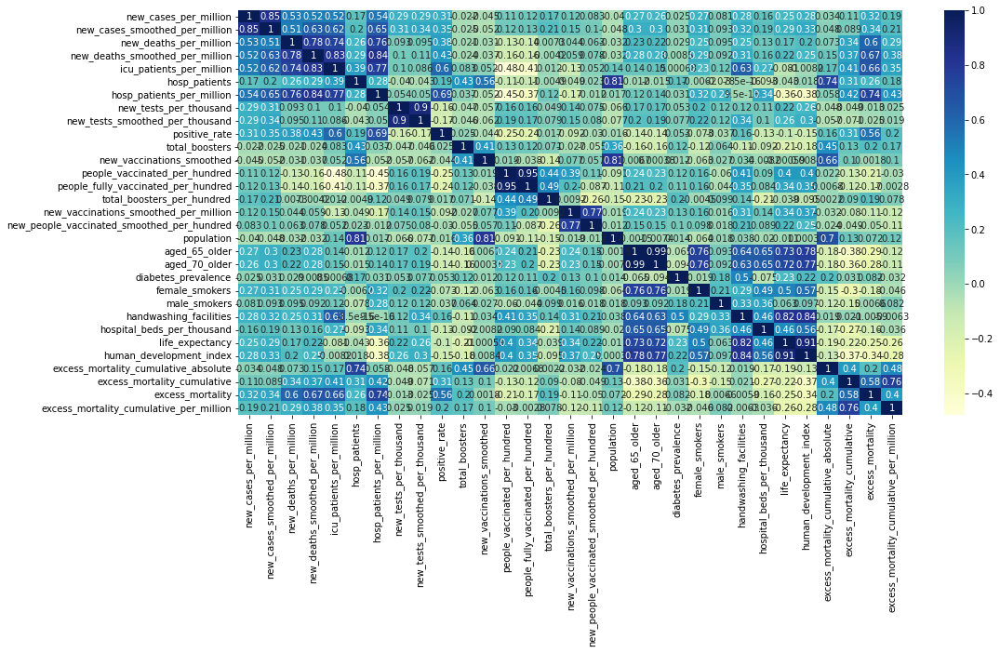

In [14]:
# plotting correlations on a heatmap

# figure size
plt.figure(figsize=(16,8))

# heatmap
sns.heatmap(cor, cmap="YlGnBu", annot=True)
plt.show()

The above corrlation maxtrix is a bit hard to read and does not make any sense without understanding what the numbers and coloumns mean. Any intersecting box with a coefficent higher than 0.7 is considered to have a high corralation, meaning that one feature increases the likilhood of another. Less that 0.7 has no interest to us. 

If we look along the coloumn "new_cases_smoothed_per_million", we do not see anything that sticks out as having an effect on covid cases. Based on this chart alone, no amount of covid vaccinations or booster shots are slowing down the spread of the virus.

If we look at 'new_deaths_smoothed_per_million', the amount of people in ICU(Intensive Care Units) beds, and people in hospitla in general, has a big impact on the amount deaths due to covid. 

The global vaccination programs are having a neglible effect in protecting the general population from dying from covid. This might be due form the over consumption of covid vaccines from the non-vunerable population such as young healthy people. The fact five year old children are given covid vaccines, when they get no benefit at all, means that the numbers will be scewed to show that the vaccines are not effective. More peer review testing needs to be done to test effetciveness the covid vaccines have for vunerbale people.   

**New covid cases vs people fully vaccinated**

In [15]:
deaths_df = deaths_df[deaths_df['date']>='2021-01-01']
ireland_df = deaths_df[deaths_df['location']=='Ireland']


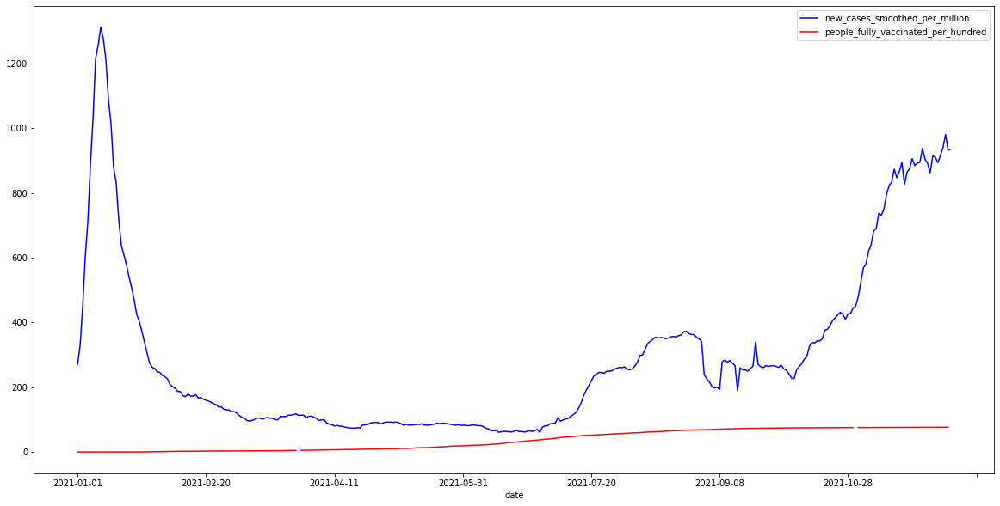

In [132]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)

ireland_df.plot(kind='line',x='date',y='new_cases_smoothed_per_million', color='blue', ax=ax)
ireland_df.plot(kind='line',x='date',y='people_fully_vaccinated_per_hundred', color='red', ax=ax)


plt.show()

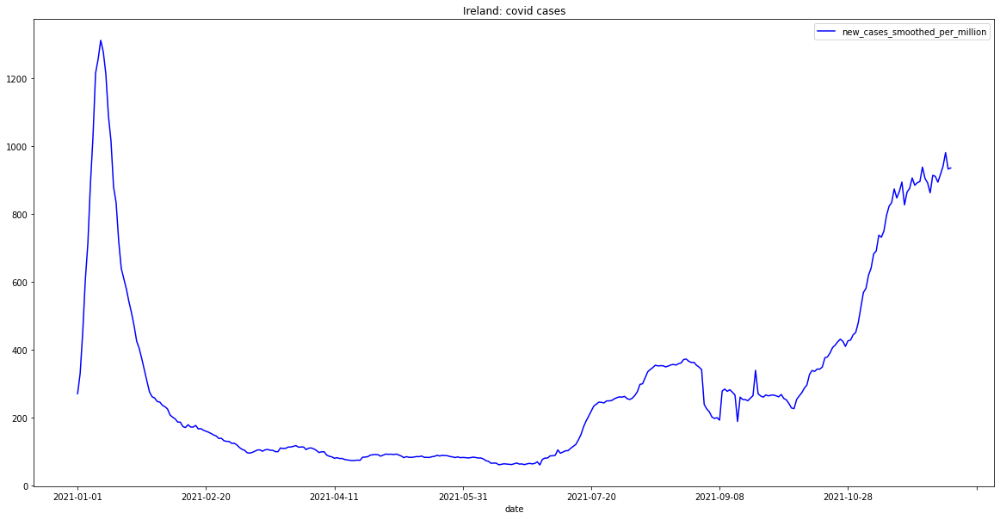

In [137]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)

ireland_df.plot(kind='line',x='date',y='new_cases_smoothed_per_million', color='blue', ax=ax, title ="Ireland: covid cases")


plt.show()

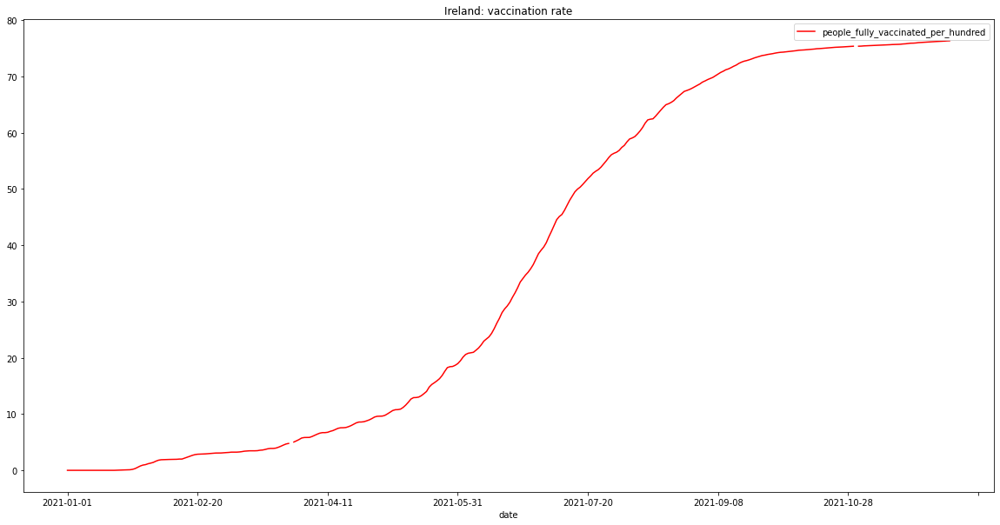

In [139]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)


ireland_df.plot(kind='line',x='date',y='people_fully_vaccinated_per_hundred', color='red', ax=ax, title ="Ireland: vaccination rate")


plt.show()

If we pick any country with a high vaccination rate, such as the Republic Of Ireland. The chart show that no matter the amount of people vaccinated per population does not help slow down the spread of covid. More vaccines do not mean less covid. 

**New covid deaths vs people fully vaccinated**

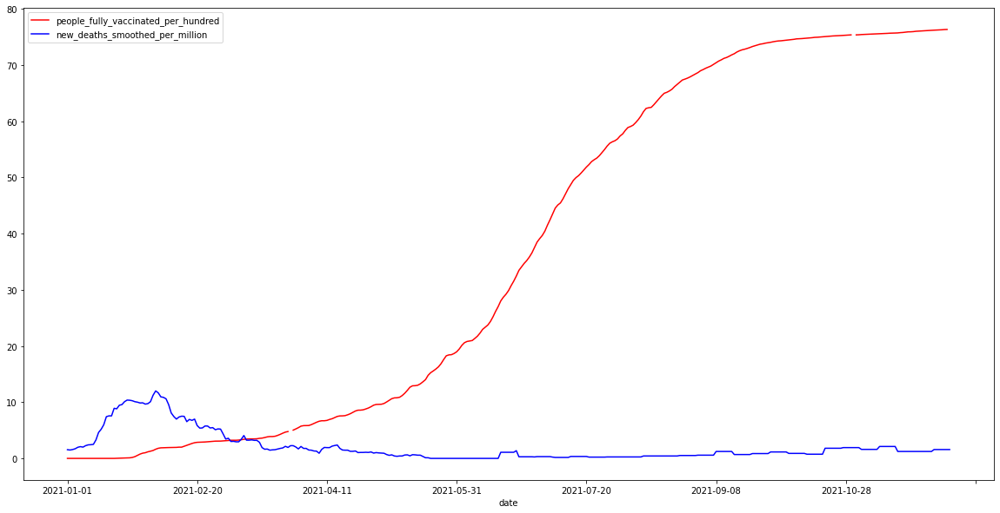

In [19]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)

ireland_df.plot(kind='line',x='date',y='people_fully_vaccinated_per_hundred', color='red', ax=ax)
ireland_df.plot(kind='line',x='date',y='new_deaths_smoothed_per_million', color='blue', ax=ax)

plt.show()

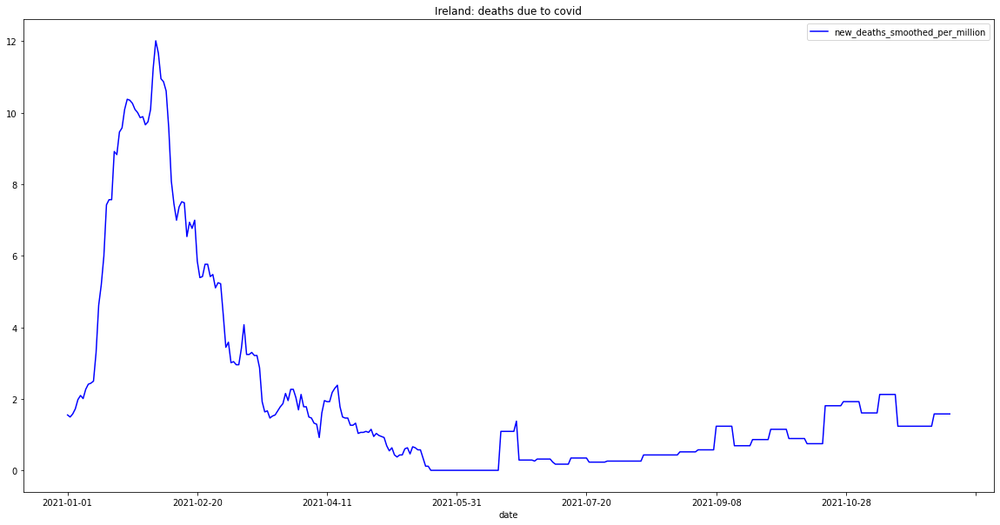

In [140]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)


ireland_df.plot(kind='line',x='date',y='new_deaths_smoothed_per_million', color='blue', ax=ax, title ="Ireland: deaths due to covid")

plt.show()

We can see here that even with more vaccinations, we still have more deaths.

*   List item
*   List item



**New covid deaths vs people in the ICU**

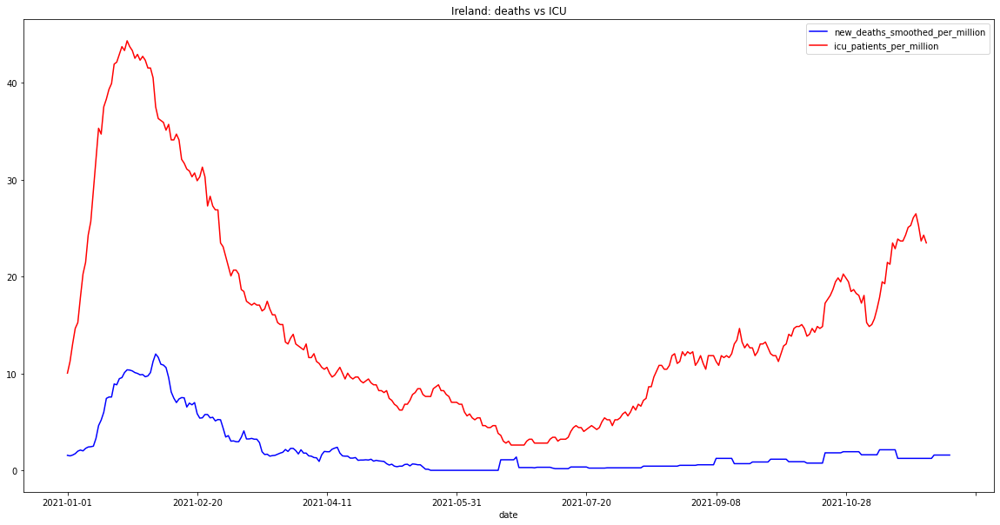

In [141]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)

ireland_df.plot(kind='line',x='date',y='new_deaths_smoothed_per_million', color='blue', ax=ax, title ="Ireland: deaths vs ICU")
ireland_df.plot(kind='line',x='date',y='icu_patients_per_million', color='red', ax=ax)

plt.show()

We can see that when there is a spike of people in the ICU, there are also a spike in covid deaths. Keep in mind that people can be in the ICU units for other reasons other than covid. 

With high coeficiants, the amount of people in ICU units and hospitals in general are the two strongest features that result in more deaths due to covid. One reason could be that resources strained, we will have mor edeaths; but also some countries like the Republic Of Ireland have patients infected with covid in the same buildings with vunerable people who are more likely to die of covid. The vast majority of people dying of covid are in nursing homes.  

**Conclusion**

As said previously, in-depth data cleaning is needed to make sure all the mathematical calculations are correct. As it currently stands, it looks like that vaccine programs are deffinetly not stopping the spread of covid. 

The covid vaccines also do not seem to have much effect on how many die due to covid. This might be due to the overconsumption of vaccines by the healthy population. More research needs to be done on the efficacy of vaccines on various demographics and vunerable groups. We dont even know if mixing various brands of vaccines is a good idea. 

Note that we do not have any data on long-term side effects which could make the situation in the ICU units worse over the next seven years. According to this study, resources would be better spent improving ICU unit hospitals in general. 

<Figure size 720x360 with 0 Axes>

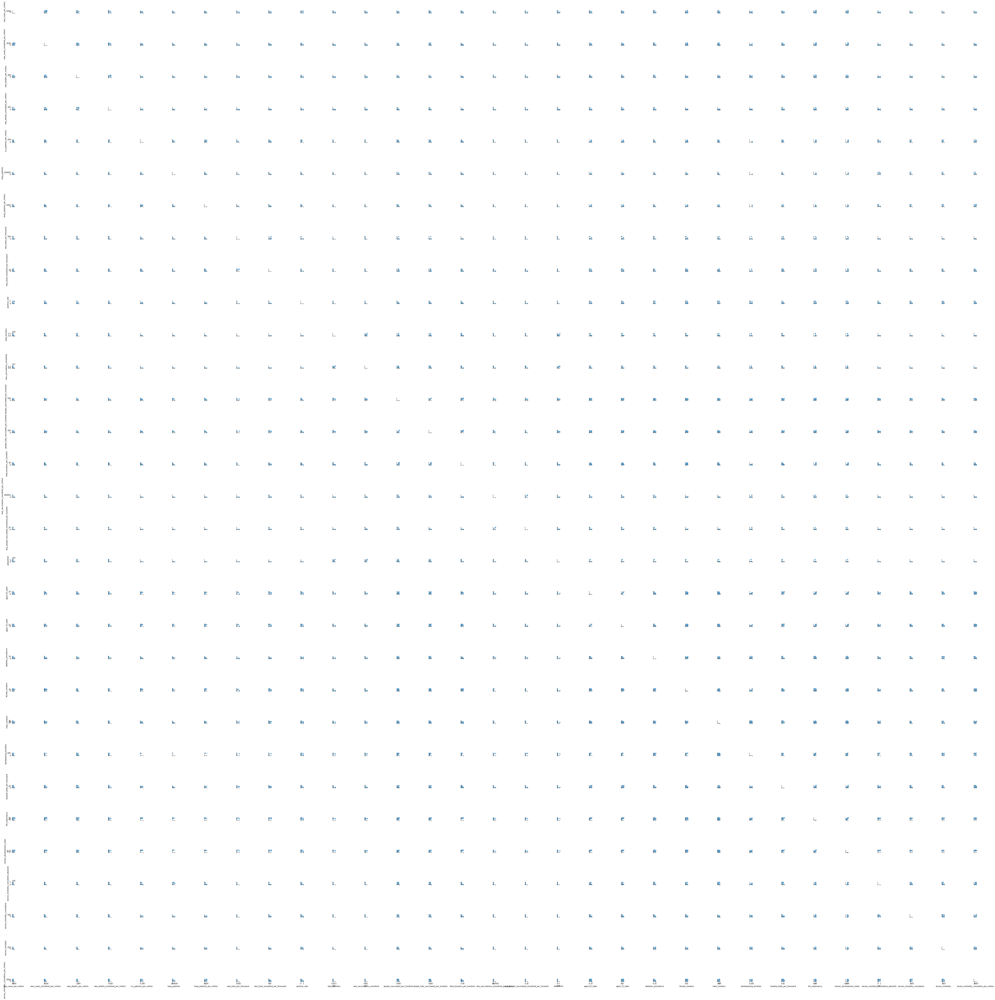

In [22]:
plt.figure(figsize=(10,5))
sns.pairplot(deaths_df_numeric)
plt.show()


**By group by day**

In [23]:
daily_df = deaths_df.groupby(deaths_df['date']).sum()
daily_df                      

,new_cases_per_million,new_cases_smoothed_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,icu_patients_per_million,hosp_patients,hosp_patients_per_million,new_tests_per_thousand,new_tests_smoothed_per_thousand,positive_rate,total_boosters,new_vaccinations_smoothed,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed_per_hundred,population,aged_65_older,aged_70_older,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-01-01,26778.498,25370.670,356.651,485.733,1111.951,273131.0,10872.760,151.119,221.940,12.820,1.400000e+01,4129769.0,21.72,0.02,0.00,31352.0,2.554,3.175795e+10,1551.030,987.072,1490.42,1487.734,4609.035,4775.729,500.883,13935.82,133.759,0.0,0.00,0.00,0.000000
2021-01-02,18309.414,25443.794,329.000,466.282,1119.640,276121.0,10980.358,160.657,223.931,12.887,1.400000e+01,4640542.0,23.98,0.02,0.00,31860.0,2.627,3.175795e+10,1551.030,987.072,1490.42,1487.734,4609.035,4775.729,500.883,13935.82,133.759,0.0,0.00,0.00,0.000000
2021-01-03,20391.983,26204.141,411.776,469.056,1140.626,282369.0,11172.894,150.250,224.846,13.038,1.800000e+01,4734607.0,25.82,0.02,0.00,32117.0,2.651,3.175795e+10,1551.030,987.072,1490.42,1487.734,4609.035,4775.729,500.883,13935.82,133.759,1756813.3,548.55,1302.65,43111.752071
2021-01-04,23334.222,26671.346,501.714,473.190,1202.484,301831.0,11675.384,242.388,227.625,13.126,1.800000e+01,5000952.0,28.67,0.05,0.00,33859.0,2.821,3.175795e+10,1551.030,987.072,1490.42,1487.734,4609.035,4775.729,500.883,13935.82,133.759,0.0,0.00,0.00,0.000000
2021-01-05,34544.127,27261.780,633.979,481.599,1204.183,303414.0,11515.105,272.864,230.353,12.957,1.800000e+01,5647529.0,32.83,0.09,0.00,36216.0,3.036,3.175795e+10,1551.030,987.072,1490.42,1487.734,4609.035,4775.729,500.883,13935.82,133.759,0.0,0.00,0.00,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-03,44212.506,38960.760,389.328,377.995,143.275,72176.0,1133.969,897.015,484.808,5.615,1.043233e+09,146653257.0,6111.07,5485.26,682.13,553933.0,14.405,3.176006e+10,1622.534,1029.299,1641.47,1543.134,4735.035,4775.729,510.183,15002.35,136.560,0.0,0.00,0.00,0.000000
2021-12-04,27491.036,39179.471,250.644,374.276,129.420,64855.0,1016.036,268.126,394.741,5.381,1.063200e+09,151106773.0,5503.30,4913.08,690.57,511598.0,12.018,3.175992e+10,1622.534,1029.299,1614.58,1543.134,4735.035,4775.729,510.183,14760.41,136.560,0.0,0.00,0.00,0.000000
2021-12-05,22204.546,38826.714,253.815,373.524,130.457,64675.0,1001.082,208.775,318.741,3.914,1.072523e+09,145358125.0,5663.88,5012.05,657.77,478869.0,10.697,3.175992e+10,1622.534,1029.299,1614.58,1543.134,4735.035,4775.729,510.183,14760.41,136.560,0.0,0.00,0.00,0.000000


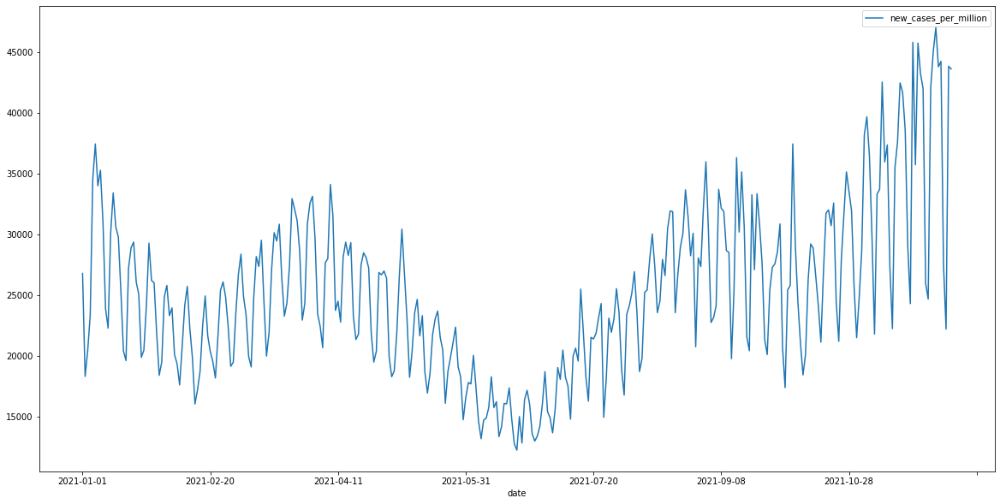

In [24]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
daily_df.plot(kind='line',y='new_cases_per_million', ax=ax)
plt.show()

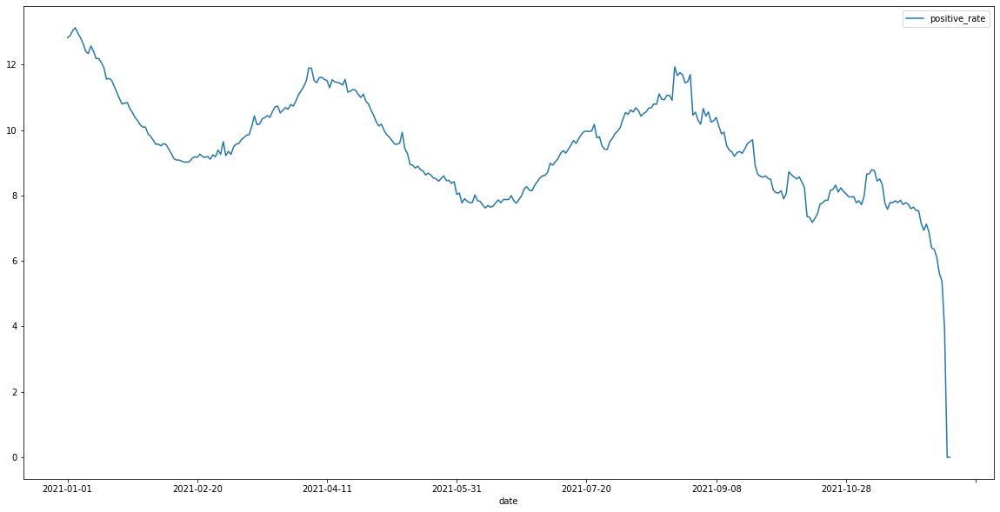

In [25]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
daily_df.plot(kind='line', y='positive_rate', ax=ax)
plt.show()

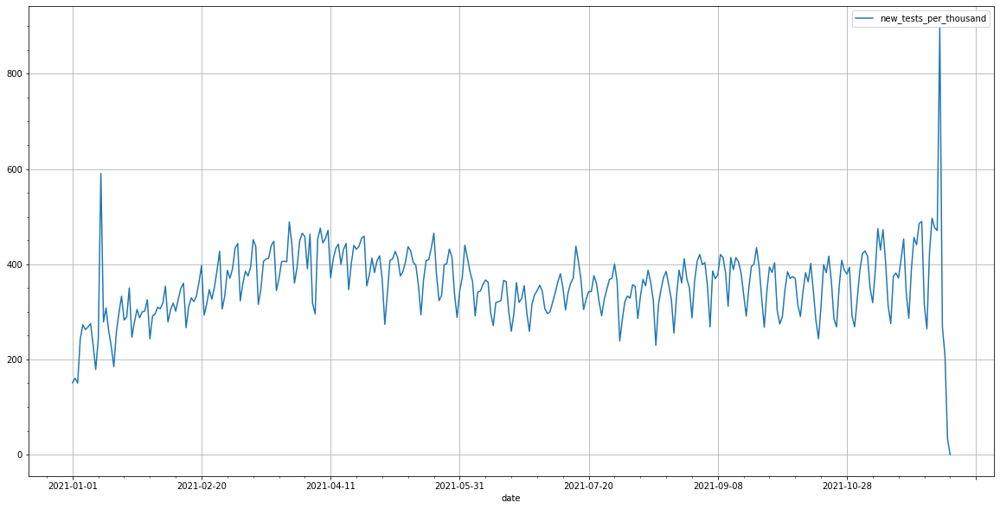

In [26]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
daily_df.plot(kind='line', y='new_tests_per_thousand', ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()


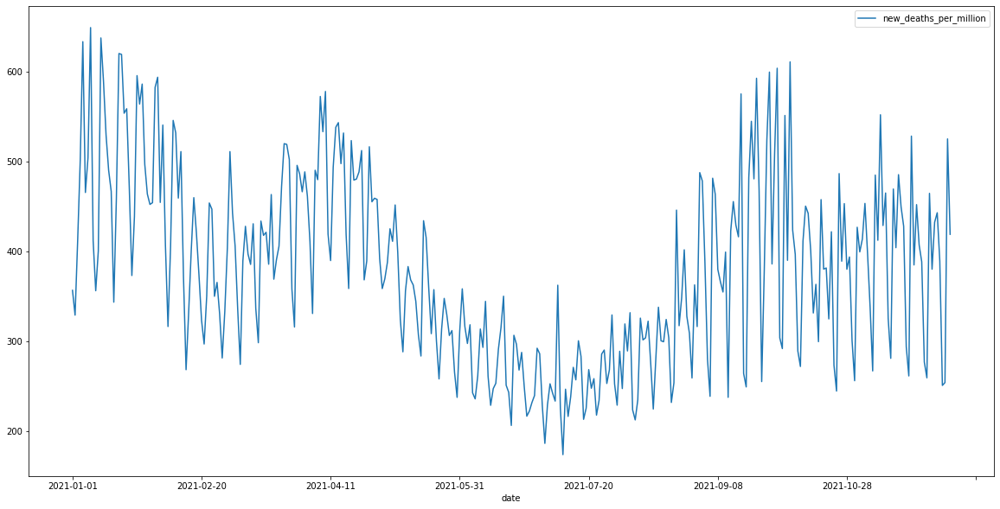

In [27]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
daily_df.plot(kind='line', y='new_deaths_per_million', ax=ax)
plt.show()

In [28]:
daily_df["DEATHPOS"] = (
    np.abs(daily_df["new_deaths_smoothed_per_million"] / (daily_df["positive_rate"] * 100 ))
)

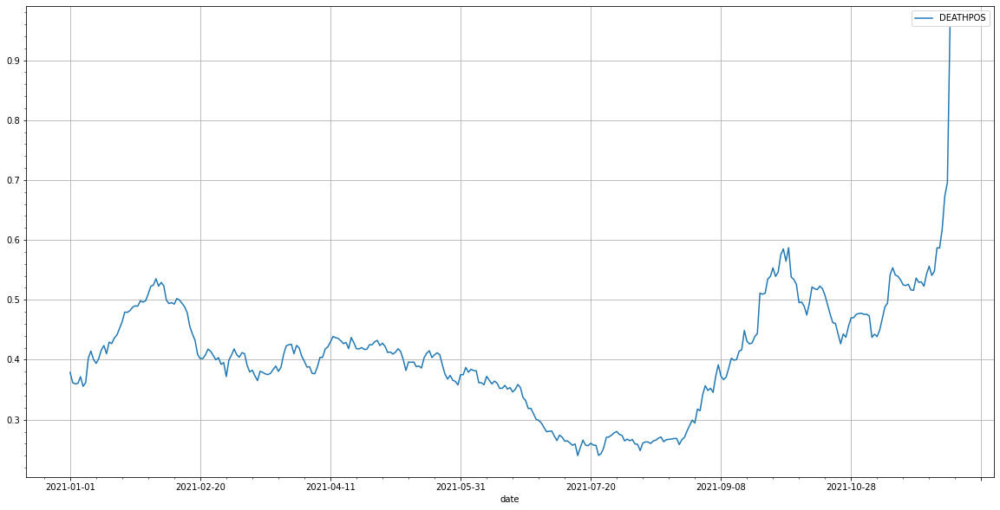

In [29]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
daily_df.plot(kind='line', y='DEATHPOS', ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()

**Ireland**

In [30]:
ireland_df = deaths_df[deaths_df['location']=='Ireland']
ireland_df

,location,date,new_cases_per_million,new_cases_smoothed_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,icu_patients_per_million,hosp_patients,hosp_patients_per_million,new_tests_per_thousand,new_tests_smoothed_per_thousand,positive_rate,total_boosters,new_vaccinations_smoothed,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed_per_hundred,population,aged_65_older,aged_70_older,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
60323,Ireland,2021-01-01,351.803,270.468,2.208,1.548,10.034,508.0,101.949,5.497,3.152,0.086,NaN,735.0,0.06,0.00,NaN,148.0,0.015,4982904.0,13.928,8.678,3.28,23.0,25.7,NaN,2.96,82.3,0.955,NaN,NaN,NaN,NaN
60324,Ireland,2021-01-02,681.129,330.616,0.803,1.491,11.238,581.0,116.599,4.184,3.405,0.097,NaN,790.0,0.08,0.00,NaN,159.0,0.016,4982904.0,13.928,8.678,3.28,23.0,25.7,NaN,2.96,82.3,0.955,NaN,NaN,NaN,NaN
60325,Ireland,2021-01-03,995.604,451.773,1.405,1.577,13.045,673.0,135.062,5.728,4.122,0.110,NaN,660.0,0.08,0.00,NaN,132.0,0.013,4982904.0,13.928,8.678,3.28,23.0,25.7,NaN,2.96,82.3,0.955,NaN,NaN,NaN,NaN
60326,Ireland,2021-01-04,1226.193,605.012,1.204,1.720,14.650,744.0,149.311,4.128,4.442,0.136,NaN,734.0,0.11,0.00,NaN,147.0,0.015,4982904.0,13.928,8.678,3.28,23.0,25.7,NaN,2.96,82.3,0.955,NaN,NaN,NaN,NaN
60327,Ireland,2021-01-05,1068.654,713.382,3.412,1.978,15.252,817.0,163.961,3.995,4.617,0.154,NaN,1223.0,0.18,0.00,NaN,245.0,0.025,4982904.0,13.928,8.678,3.28,23.0,25.7,NaN,2.96,82.3,0.955,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60659,Ireland,2021-12-03,1085.311,915.817,0.000,1.577,NaN,NaN,NaN,6.353,6.390,0.143,951531.0,31272.0,77.58,76.26,19.10,6276.0,0.027,4982904.0,13.928,8.678,3.28,23.0,25.7,NaN,2.96,82.3,0.955,NaN,NaN,NaN,NaN
60660,Ireland,2021-12-04,1128.258,939.641,0.000,1.577,NaN,NaN,NaN,NaN,NaN,NaN,971595.0,30756.0,77.60,76.29,19.50,6172.0,0.027,4982904.0,13.928,8.678,3.28,23.0,25.7,NaN,2.96,82.3,0.955,NaN,NaN,NaN,NaN
60661,Ireland,2021-12-05,1034.738,980.381,0.000,1.577,NaN,NaN,NaN,NaN,NaN,NaN,986424.0,30450.0,77.63,76.33,19.80,6111.0,0.025,4982904.0,13.928,8.678,3.28,23.0,25.7,NaN,2.96,82.3,0.955,NaN,NaN,NaN,NaN
60662,Ireland,2021-12-06,584.197,931.872,0.000,1.577,NaN,NaN,NaN,NaN,NaN,NaN,1005656.0,30313.0,77.65,76.35,20.18,6083.0,0.026,4982904.0,13.928,8.678,3.28,23.0,25.7,NaN,2.96,82.3,0.955,NaN,NaN,NaN,NaN


In [31]:
ireland_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 341 entries, 60323 to 60663
Data columns (total 33 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   location                                    341 non-null    object 
 1   date                                        341 non-null    object 
 2   new_cases_per_million                       341 non-null    float64
 3   new_cases_smoothed_per_million              341 non-null    float64
 4   new_deaths_per_million                      341 non-null    float64
 5   new_deaths_smoothed_per_million             341 non-null    float64
 6   icu_patients_per_million                    332 non-null    float64
 7   hosp_patients                               329 non-null    float64
 8   hosp_patients_per_million                   329 non-null    float64
 9   new_tests_per_thousand                      337 non-null    float64
 10  new_test

In [32]:
may_ireland_df = ireland_df[ireland_df['date']=='2020-05-11']
may_ireland_df

,location,date,new_cases_per_million,new_cases_smoothed_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,icu_patients_per_million,hosp_patients,hosp_patients_per_million,new_tests_per_thousand,new_tests_smoothed_per_thousand,positive_rate,total_boosters,new_vaccinations_smoothed,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed_per_hundred,population,aged_65_older,aged_70_older,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million


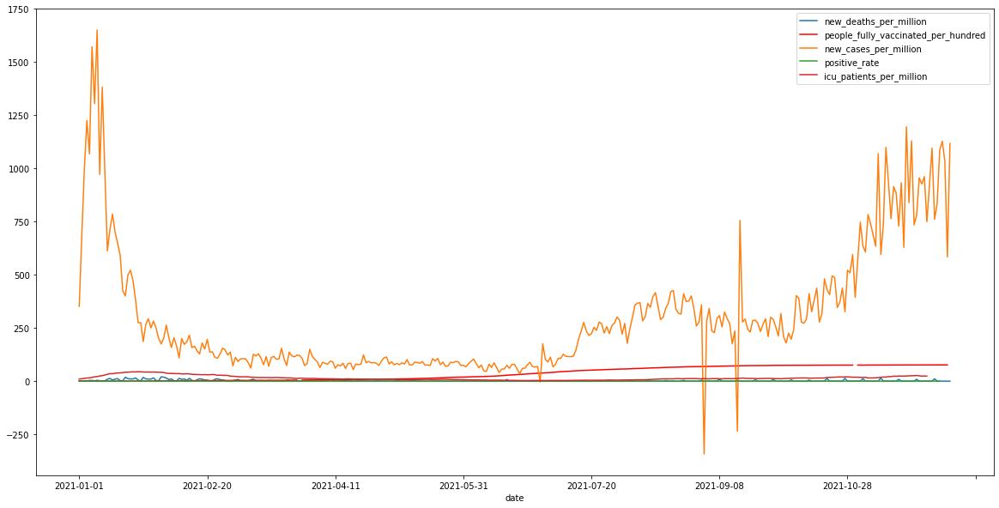

In [33]:
# gca stands for 'get current axis'
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)

ireland_df.plot(kind='line',x='date',y='new_deaths_per_million', ax=ax)
ireland_df.plot(kind='line',x='date',y='people_fully_vaccinated_per_hundred', color='red', ax=ax)
ireland_df.plot(kind='line',x='date',y='new_cases_per_million', ax=ax)
ireland_df.plot(kind='line',x='date',y='positive_rate', ax=ax)
ireland_df.plot(kind='line',x='date',y='icu_patients_per_million', ax=ax)

plt.show()

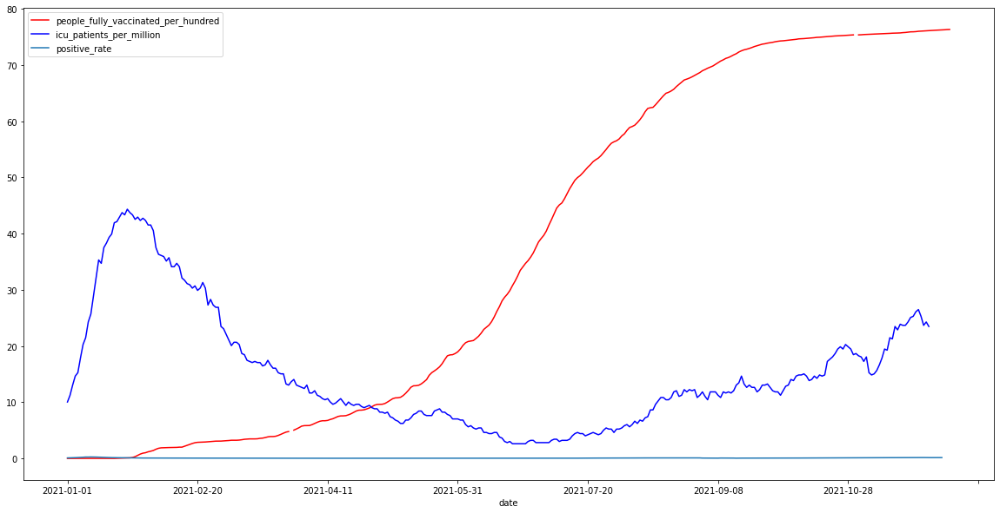

In [34]:
# gca stands for 'get current axis'
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)

ireland_df.plot(kind='line',x='date',y='people_fully_vaccinated_per_hundred', color='red', ax=ax)
ireland_df.plot(kind='line',x='date',y='icu_patients_per_million', color='blue', ax=ax)
ireland_df.plot(kind='line',x='date',y='positive_rate', ax=ax)

plt.show()

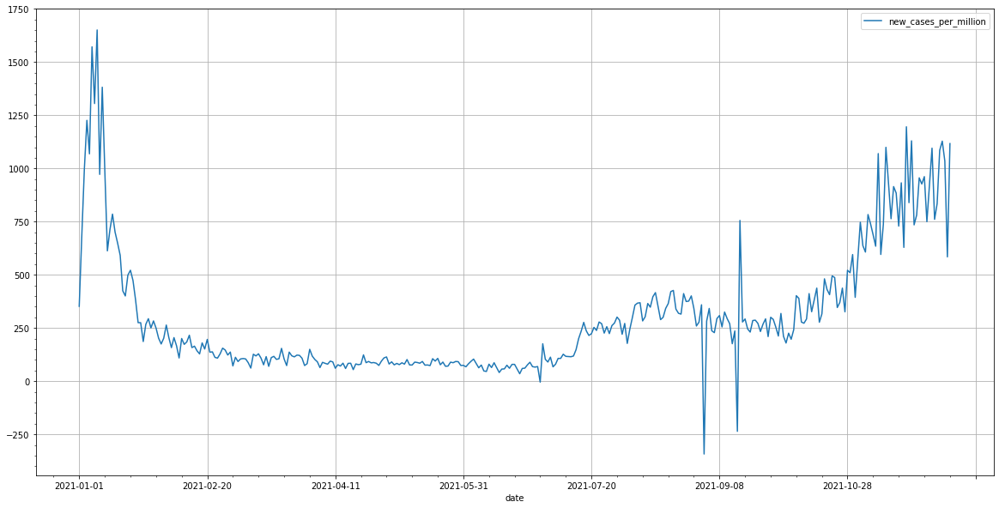

In [35]:
ax = plt.gca()

ireland_df.plot(kind='line',x='date',y='new_cases_per_million',ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()

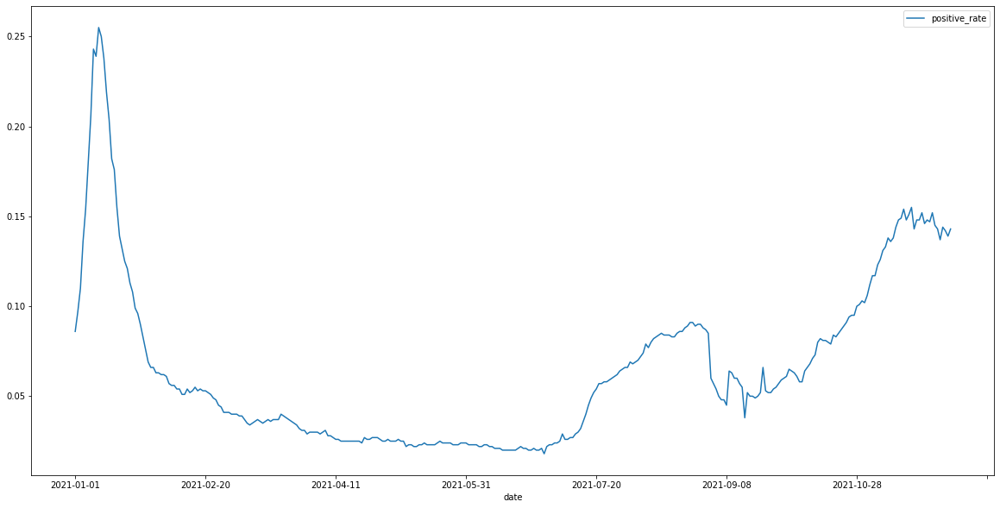

In [36]:
ax = plt.gca()

ireland_df.plot(kind='line',x='date',y='positive_rate',ax=ax)

plt.show()

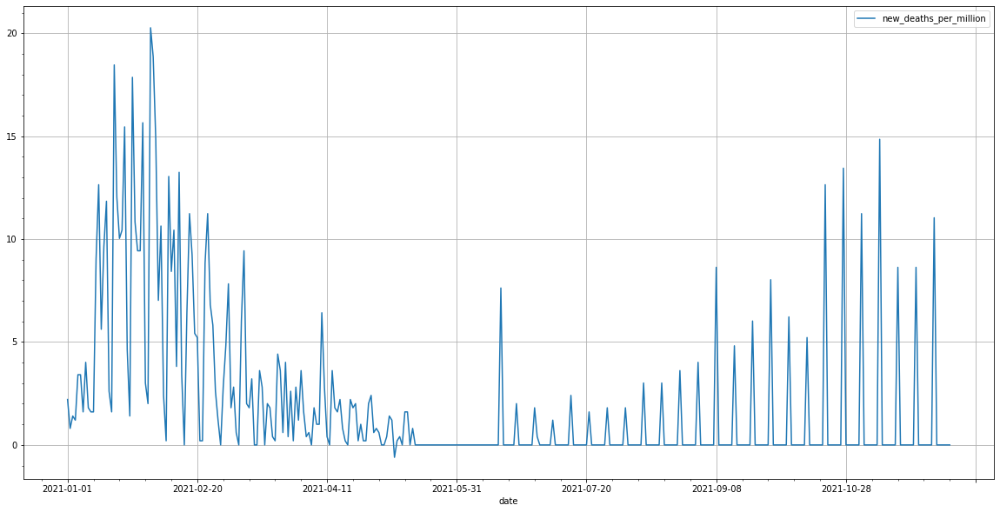

In [37]:
ax = plt.gca()

ireland_df.plot(kind='line',x='date',y='new_deaths_per_million',ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()

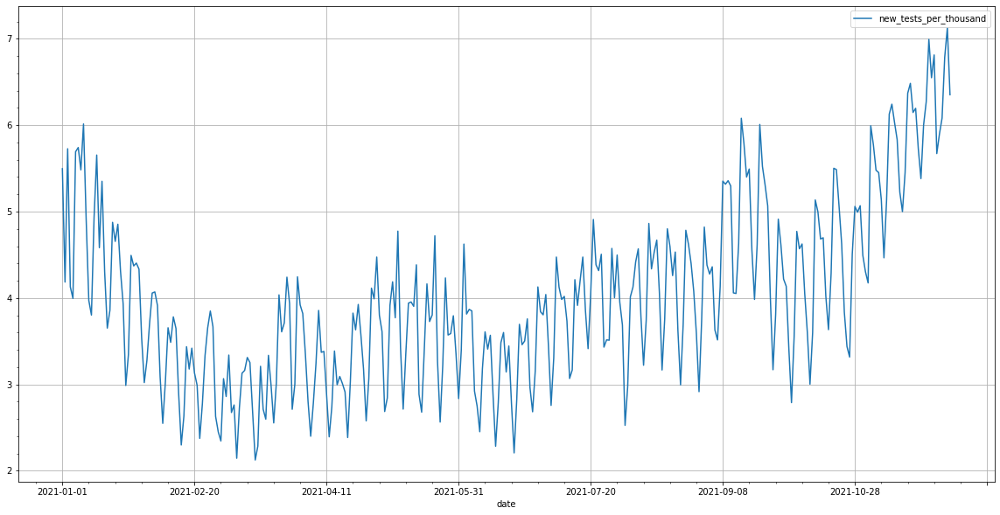

In [38]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
ireland_df.plot(kind='line',x='date',y='new_tests_per_thousand',ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()

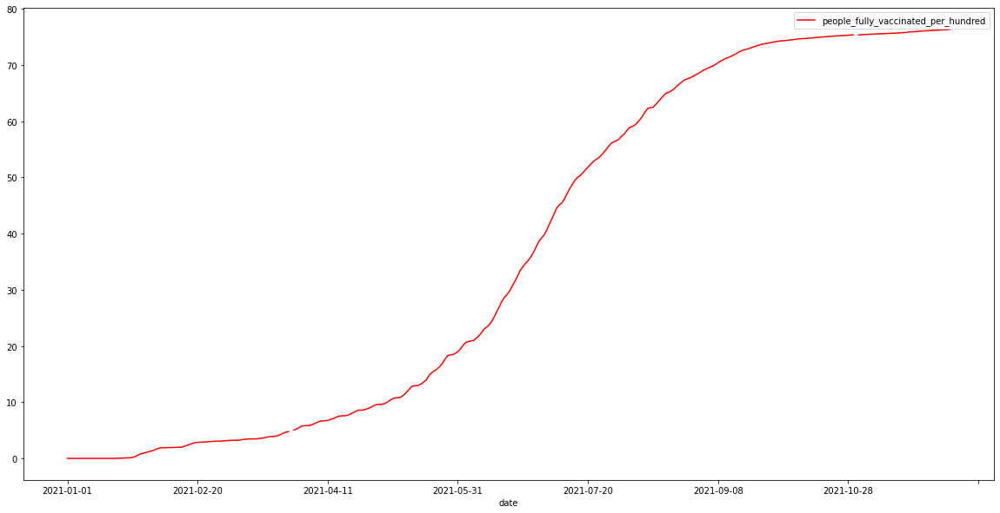

In [39]:
ax = plt.gca()

ireland_df.plot(kind='line',x='date',y='people_fully_vaccinated_per_hundred', color='red', ax=ax)

plt.show()

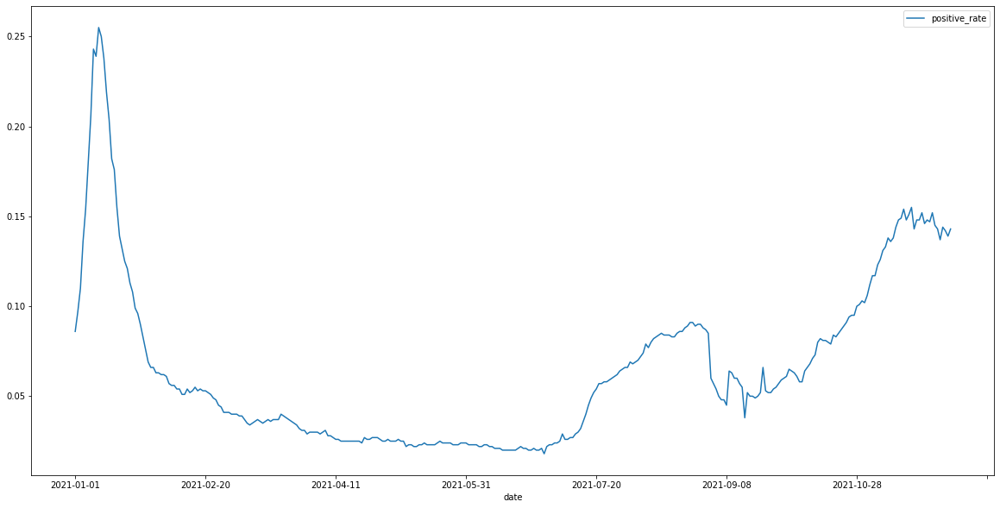

In [40]:
ax = plt.gca()

ireland_df.plot(kind='line',x='date',y='positive_rate', ax=ax)

plt.show()

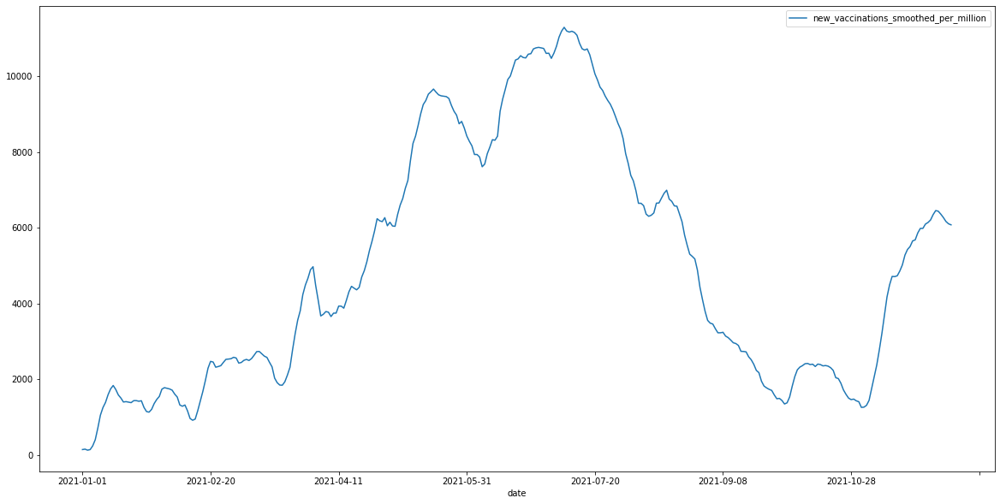

In [41]:
ax = plt.gca()

ireland_df.plot(kind='line',x='date',y='new_vaccinations_smoothed_per_million', ax=ax)

plt.show()

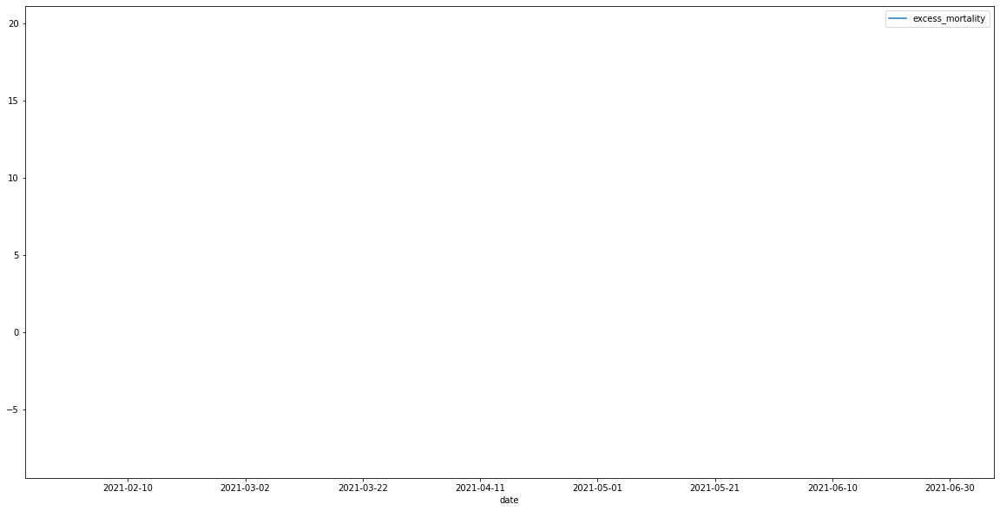

In [42]:
ax = plt.gca()

ireland_df.plot(kind='line',x='date',y='excess_mortality', ax=ax)

plt.show()

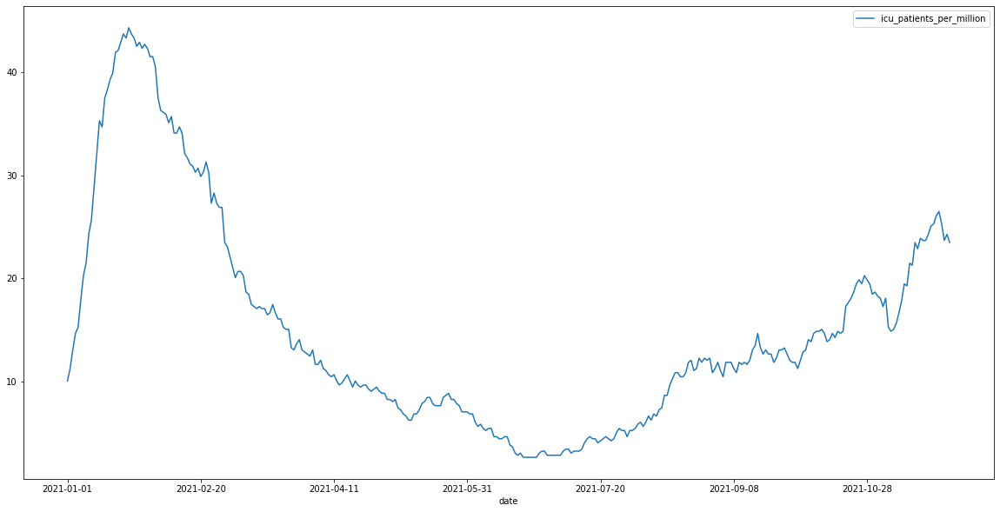

In [43]:
ax = plt.gca()

ireland_df.plot(kind='line',x='date',y='icu_patients_per_million', ax=ax)

plt.show()



**Austria**

In [44]:
austria_df = deaths_df[deaths_df['location']=='Austria']
austria_df

,location,date,new_cases_per_million,new_cases_smoothed_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,icu_patients_per_million,hosp_patients,hosp_patients_per_million,new_tests_per_thousand,new_tests_smoothed_per_thousand,positive_rate,total_boosters,new_vaccinations_smoothed,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed_per_hundred,population,aged_65_older,aged_70_older,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
8118,Austria,2021-01-01,231.780,218.889,4.313,7.551,42.574,1858.0,205.461,NaN,0.741,NaN,NaN,886.0,0.06,NaN,NaN,98.0,0.010,9043072.0,19.202,13.748,6.35,28.4,30.9,NaN,7.37,81.54,0.922,NaN,NaN,NaN,NaN
8119,Austria,2021-01-02,153.819,218.289,1.548,6.824,42.574,1858.0,205.461,NaN,0.519,NaN,NaN,742.0,0.06,NaN,NaN,82.0,0.008,9043072.0,19.202,13.748,6.35,28.4,30.9,NaN,7.37,81.54,0.922,NaN,NaN,NaN,NaN
8120,Austria,2021-01-03,162.113,219.205,5.419,6.998,40.141,1864.0,206.125,NaN,0.367,NaN,NaN,637.0,0.06,NaN,NaN,70.0,0.007,9043072.0,19.202,13.748,6.35,28.4,30.9,NaN,7.37,81.54,0.922,7773.6,9.28,14.23,859.619386
8121,Austria,2021-01-04,181.575,219.995,3.649,6.730,40.694,1953.0,215.966,1.393,0.231,NaN,NaN,466.0,0.06,NaN,NaN,52.0,0.005,9043072.0,19.202,13.748,6.35,28.4,30.9,NaN,7.37,81.54,0.922,NaN,NaN,NaN,NaN
8122,Austria,2021-01-05,255.555,226.993,11.058,6.287,41.026,2033.0,224.813,1.708,0.470,NaN,NaN,486.0,0.08,NaN,NaN,54.0,0.005,9043072.0,19.202,13.748,6.35,28.4,30.9,NaN,7.37,81.54,0.922,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8454,Austria,2021-12-03,745.101,1024.431,7.520,6.461,NaN,NaN,NaN,44.268,43.095,0.024,2268848.0,105066.0,70.68,66.67,25.09,11618.0,0.123,9043072.0,19.202,13.748,6.35,28.4,30.9,NaN,7.37,81.54,0.922,NaN,NaN,NaN,NaN
8455,Austria,2021-12-04,807.690,955.443,6.635,6.382,NaN,NaN,NaN,32.782,42.297,0.023,2327295.0,102965.0,70.80,66.86,25.74,11386.0,0.120,9043072.0,19.202,13.748,6.35,28.4,30.9,NaN,7.37,81.54,0.922,NaN,NaN,NaN,NaN
8456,Austria,2021-12-05,574.141,871.938,4.755,6.445,NaN,NaN,NaN,32.337,42.680,0.020,2353858.0,101022.0,70.85,66.96,26.03,11171.0,0.117,9043072.0,19.202,13.748,6.35,28.4,30.9,NaN,7.37,81.54,0.922,NaN,NaN,NaN,NaN
8457,Austria,2021-12-06,511.441,810.313,5.308,6.619,NaN,NaN,NaN,NaN,NaN,NaN,2409503.0,99482.0,70.93,67.12,26.64,11001.0,0.114,9043072.0,19.202,13.748,6.35,28.4,30.9,NaN,7.37,81.54,0.922,NaN,NaN,NaN,NaN


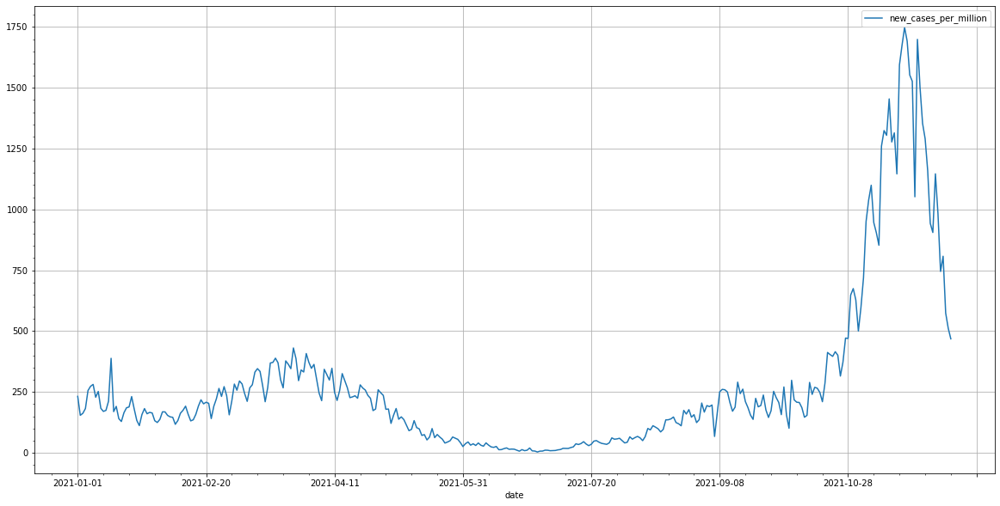

In [45]:
ax = plt.gca()

austria_df.plot(kind='line',x='date',y='new_cases_per_million',ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()

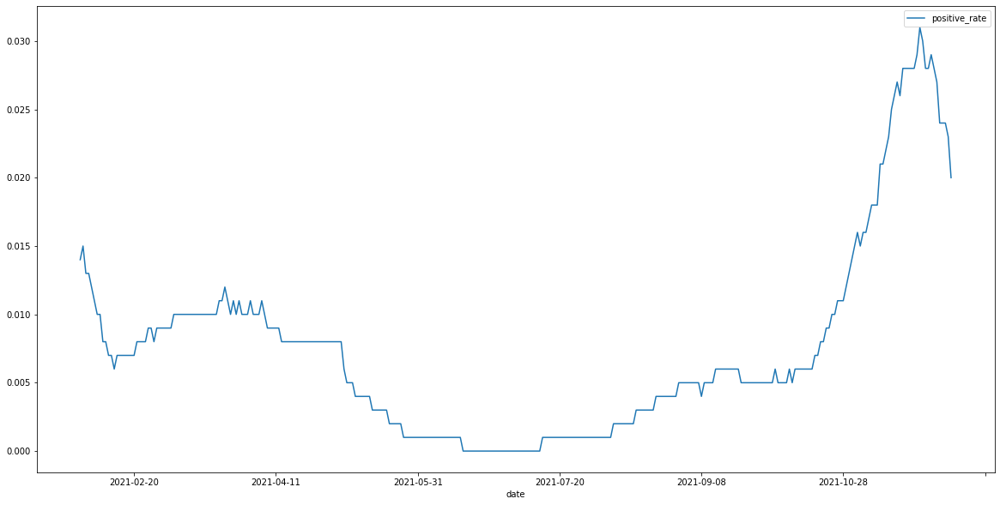

In [46]:
ax = plt.gca()

austria_df.plot(kind='line',x='date',y='positive_rate',ax=ax)

plt.show()

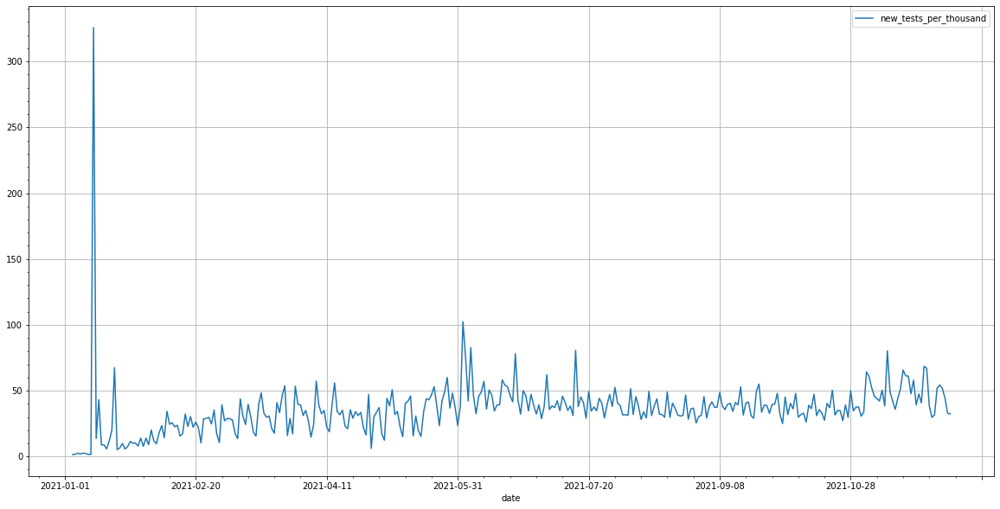

In [47]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
austria_df.plot(kind='line',x='date',y='new_tests_per_thousand',ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()

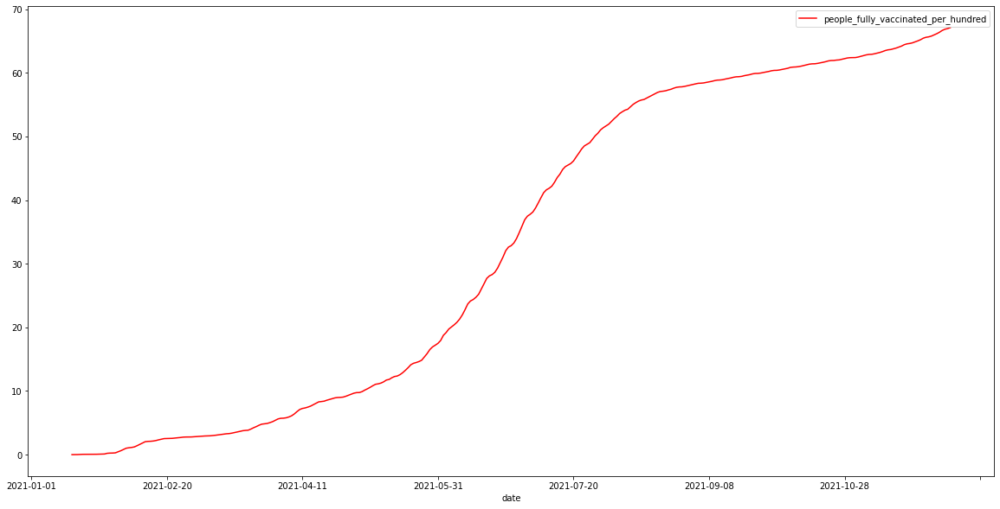

In [48]:
ax = plt.gca()

austria_df.plot(kind='line',x='date',y='people_fully_vaccinated_per_hundred', color='red', ax=ax)

plt.show()

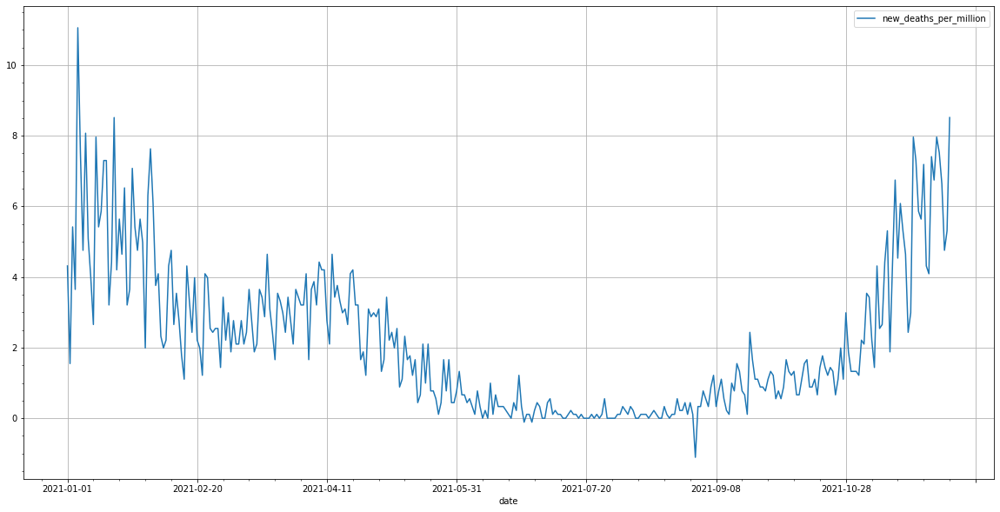

In [49]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
austria_df.plot(kind='line',x='date',y='new_deaths_per_million',ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()

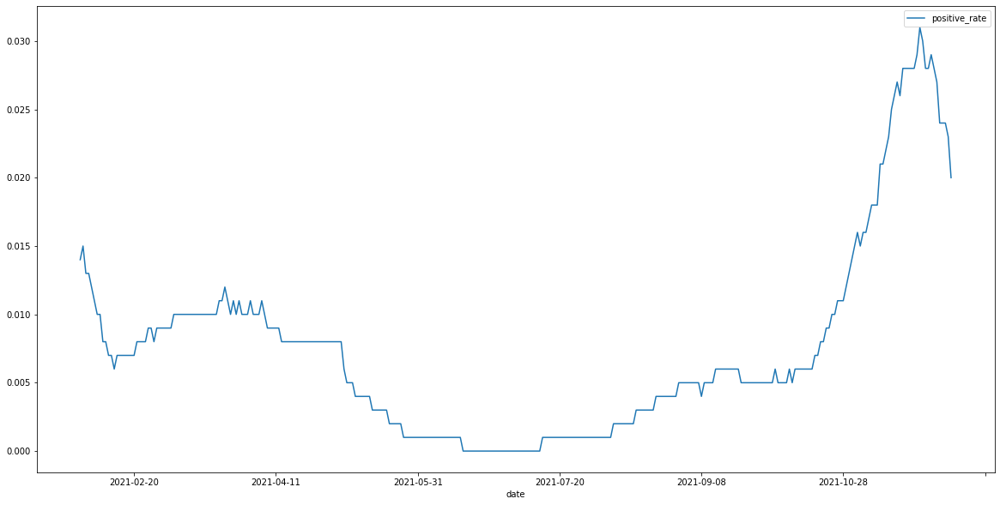

In [50]:
ax = plt.gca()

austria_df.plot(kind='line',x='date',y='positive_rate', ax=ax)

plt.show()

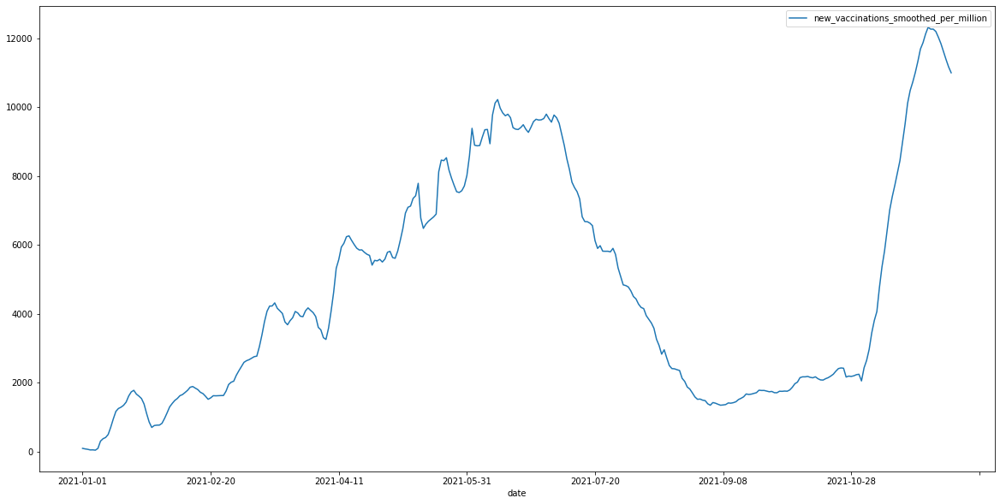

In [51]:
ax = plt.gca()

austria_df.plot(kind='line',x='date',y='new_vaccinations_smoothed_per_million', ax=ax)

plt.show()

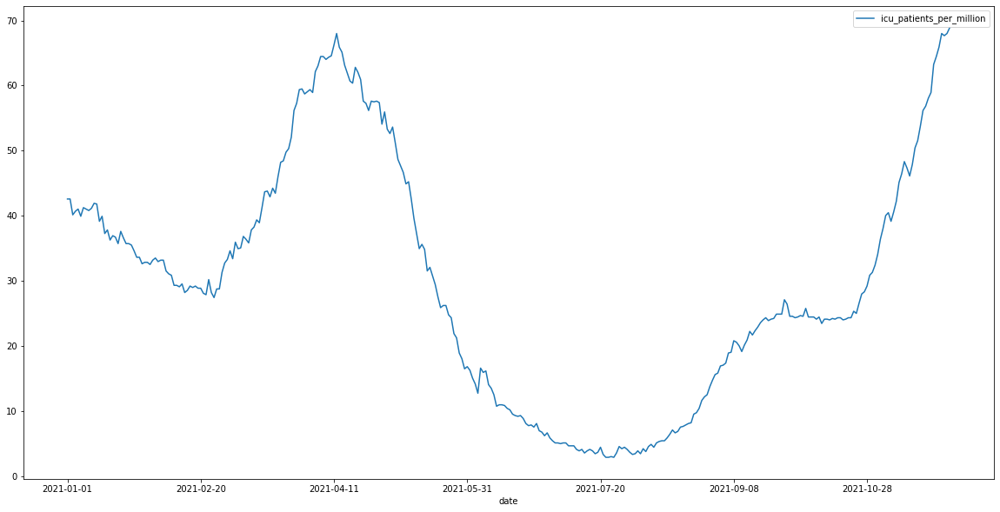

In [52]:
ax = plt.gca()

austria_df.plot(kind='line',x='date',y='icu_patients_per_million', ax=ax)

plt.show()



**Russia**

In [53]:
russia_df = deaths_df[deaths_df['location']=='Russia']
russia_df

,location,date,new_cases_per_million,new_cases_smoothed_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,icu_patients_per_million,hosp_patients,hosp_patients_per_million,new_tests_per_thousand,new_tests_smoothed_per_thousand,positive_rate,total_boosters,new_vaccinations_smoothed,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed_per_hundred,population,aged_65_older,aged_70_older,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
102985,Russia,2021-01-01,182.391,186.678,3.612,3.733,NaN,NaN,NaN,2.645,2.843,0.066,NaN,68000.0,NaN,NaN,NaN,466.0,0.047,145912022.0,14.178,9.393,6.18,23.4,58.3,NaN,8.05,72.58,0.824,NaN,NaN,NaN,NaN
102986,Russia,2021-01-02,177.765,183.844,2.995,3.619,NaN,NaN,NaN,NaN,2.527,0.073,NaN,68000.0,0.55,NaN,NaN,466.0,0.047,145912022.0,14.178,9.393,6.18,23.4,58.3,NaN,8.05,72.58,0.824,NaN,NaN,NaN,NaN
102987,Russia,2021-01-03,163.420,179.923,3.392,3.574,NaN,NaN,NaN,NaN,2.287,0.079,NaN,60883.0,NaN,NaN,NaN,417.0,0.042,145912022.0,14.178,9.393,6.18,23.4,58.3,NaN,8.05,72.58,0.824,NaN,NaN,NaN,NaN
102988,Russia,2021-01-04,157.732,175.667,3.242,3.568,NaN,NaN,NaN,1.493,2.214,0.079,NaN,53766.0,NaN,NaN,NaN,368.0,0.037,145912022.0,14.178,9.393,6.18,23.4,58.3,NaN,8.05,72.58,0.824,NaN,NaN,NaN,NaN
102989,Russia,2021-01-05,164.174,173.089,3.447,3.524,NaN,NaN,NaN,1.841,2.090,0.083,NaN,46649.0,NaN,NaN,NaN,320.0,0.032,145912022.0,14.178,9.393,6.18,23.4,58.3,NaN,8.05,72.58,0.824,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103321,Russia,2021-12-03,221.476,223.553,8.114,8.155,NaN,NaN,NaN,NaN,3.817,0.059,4671320.0,655686.0,46.24,39.66,3.20,4494.0,0.159,145912022.0,14.178,9.393,6.18,23.4,58.3,NaN,8.05,72.58,0.824,NaN,NaN,NaN,NaN
103322,Russia,2021-12-04,221.873,222.824,8.121,8.137,NaN,NaN,NaN,NaN,3.886,0.057,4821751.0,739490.0,46.60,40.08,3.30,5068.0,0.194,145912022.0,14.178,9.393,6.18,23.4,58.3,NaN,8.05,72.58,0.824,NaN,NaN,NaN,NaN
103323,Russia,2021-12-05,219.399,222.067,8.060,8.123,NaN,NaN,NaN,NaN,3.956,0.056,4937582.0,719938.0,46.62,40.23,3.38,4934.0,0.179,145912022.0,14.178,9.393,6.18,23.4,58.3,NaN,8.05,72.58,0.824,NaN,NaN,NaN,NaN
103324,Russia,2021-12-06,216.356,220.500,7.916,8.101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,703467.0,46.68,40.30,NaN,4821.0,0.181,145912022.0,14.178,9.393,6.18,23.4,58.3,NaN,8.05,72.58,0.824,NaN,NaN,NaN,NaN


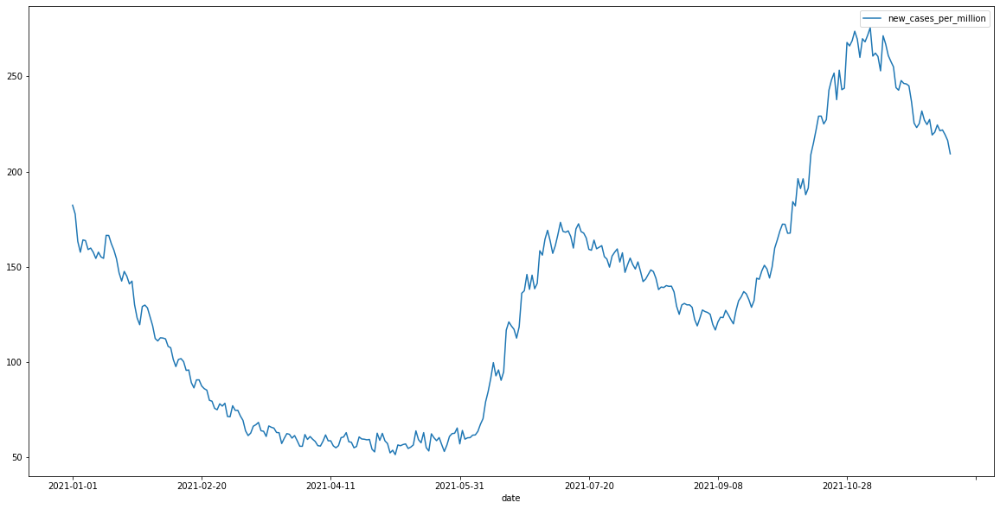

In [54]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
russia_df.plot(kind='line',x='date',y='new_cases_per_million', ax=ax)
plt.show()

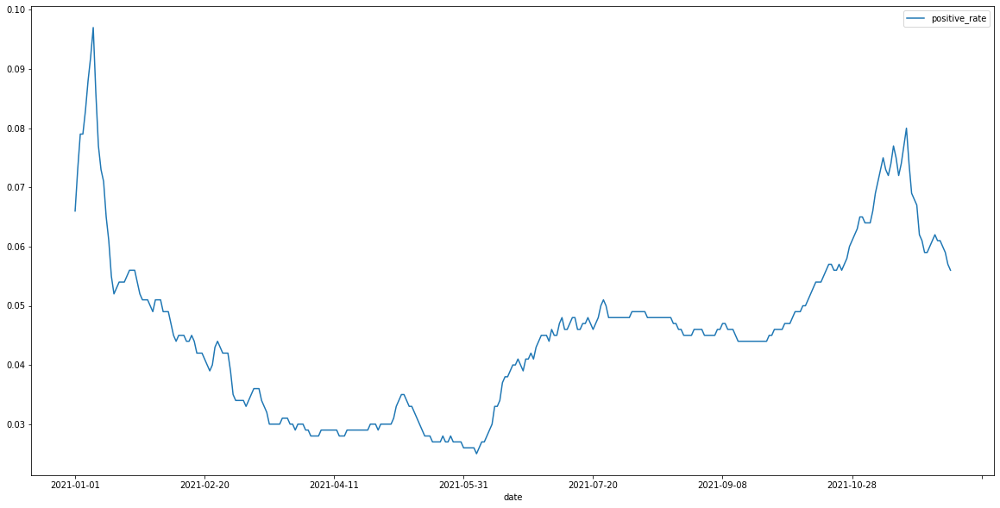

In [55]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
russia_df.plot(kind='line',x='date',y='positive_rate', ax=ax)
plt.show()

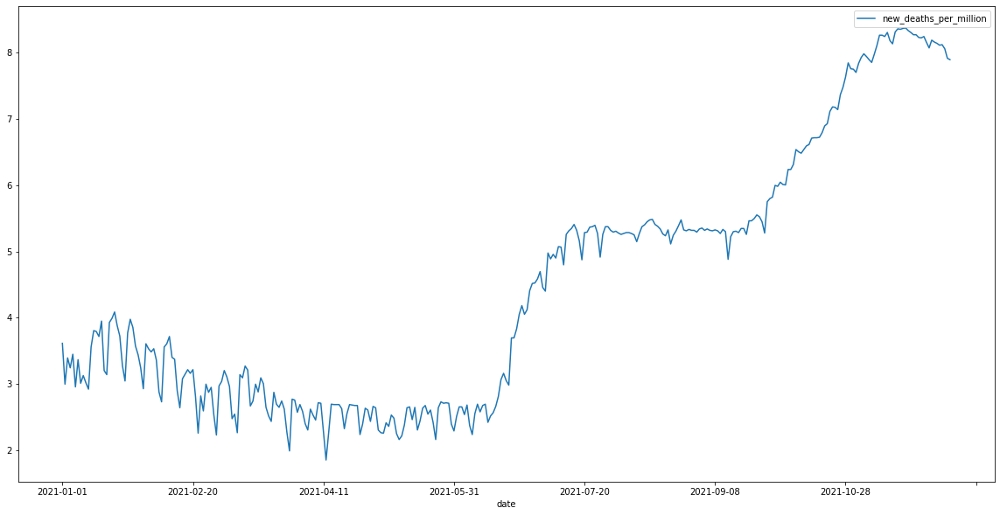

In [56]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
russia_df.plot(kind='line',x='date',y='new_deaths_per_million', ax=ax)
plt.show()

In [57]:
russia_df["DEATHPOS"] = (
    np.abs(russia_df["new_deaths_smoothed_per_million"] / (russia_df["positive_rate"] * 100 ))
)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



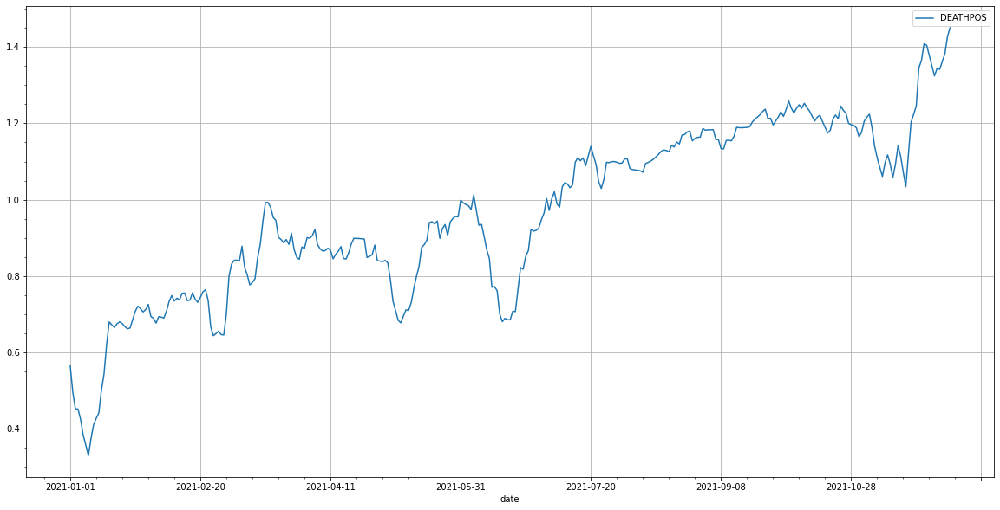

In [58]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
russia_df.plot(kind='line',x='date',y='DEATHPOS', ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()

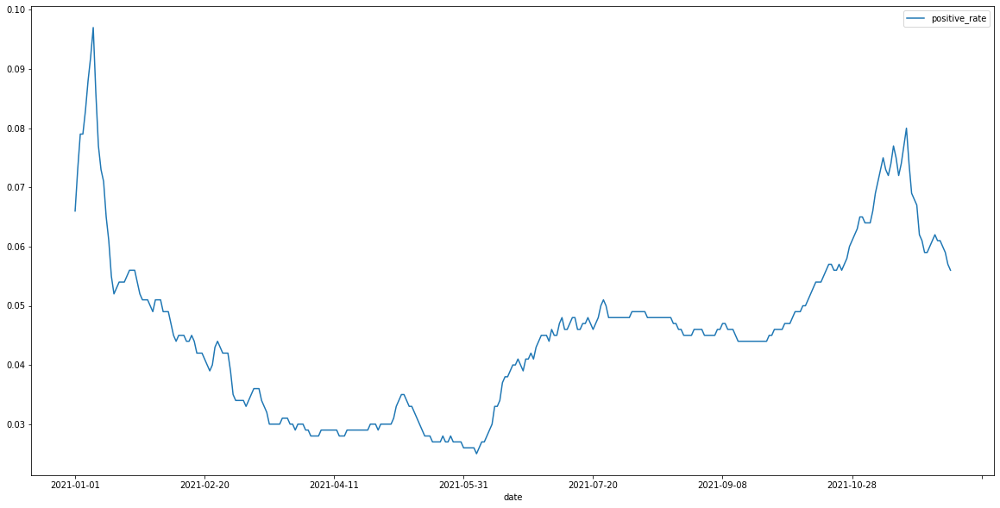

In [59]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
russia_df.plot(kind='line',x='date',y='positive_rate', ax=ax)
plt.show()

In [60]:
russia_df.plot(kind='line',x='date',y='positive_rate', ax=ax)
russia_df.plot(kind='line',x='date',y='icu_patients_per_million', ax=ax)

russia_df.plot(kind='line',x='date',y='new_deaths_per_million', ax=ax)
russia_df.plot(kind='line',x='date',y='people_fully_vaccinated_per_hundred', color='red', ax=ax)

**Taiwan**

In [61]:
taiwan_df = deaths_df[deaths_df['location']=='Taiwan']
taiwan_df

,location,date,new_cases_per_million,new_cases_smoothed_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,icu_patients_per_million,hosp_patients,hosp_patients_per_million,new_tests_per_thousand,new_tests_smoothed_per_thousand,positive_rate,total_boosters,new_vaccinations_smoothed,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed_per_hundred,population,aged_65_older,aged_70_older,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
121609,Taiwan,2021-01-01,0.126,0.132,0.0,0.0,NaN,NaN,NaN,0.008,0.023,0.006,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23855008.0,NaN,8.353,NaN,NaN,NaN,NaN,NaN,80.46,NaN,NaN,NaN,NaN,NaN
121610,Taiwan,2021-01-02,0.252,0.150,0.0,0.0,NaN,NaN,NaN,0.011,0.023,0.007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23855008.0,NaN,8.353,NaN,NaN,NaN,NaN,NaN,80.46,NaN,NaN,NaN,NaN,NaN
121611,Taiwan,2021-01-03,0.168,0.162,0.0,0.0,NaN,NaN,NaN,0.007,0.022,0.007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23855008.0,NaN,8.353,NaN,NaN,NaN,NaN,NaN,80.46,NaN,NaN,NaN,NaN,NaN
121612,Taiwan,2021-01-04,0.126,0.132,0.0,0.0,NaN,NaN,NaN,0.050,0.023,0.006,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23855008.0,NaN,8.353,NaN,NaN,NaN,NaN,NaN,80.46,NaN,NaN,NaN,NaN,NaN
121613,Taiwan,2021-01-05,0.084,0.132,0.0,0.0,NaN,NaN,NaN,0.025,0.021,0.006,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23855008.0,NaN,8.353,NaN,NaN,NaN,NaN,NaN,80.46,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121945,Taiwan,2021-12-03,0.461,0.425,0.0,0.0,NaN,NaN,NaN,0.737,0.654,0.001,2222.0,232095.0,76.67,58.62,0.01,9729.0,0.073,23855008.0,NaN,8.353,NaN,NaN,NaN,NaN,NaN,80.46,NaN,NaN,NaN,NaN,NaN
121946,Taiwan,2021-12-04,0.461,0.419,0.0,0.0,NaN,NaN,NaN,0.455,0.643,0.001,NaN,223646.0,NaN,NaN,NaN,9375.0,0.069,23855008.0,NaN,8.353,NaN,NaN,NaN,NaN,NaN,80.46,NaN,NaN,NaN,NaN,NaN
121947,Taiwan,2021-12-05,0.168,0.383,0.0,0.0,NaN,NaN,NaN,0.255,0.622,0.001,4974.0,215198.0,76.72,59.40,0.02,9021.0,0.065,23855008.0,NaN,8.353,NaN,NaN,NaN,NaN,NaN,80.46,NaN,NaN,NaN,NaN,NaN
121948,Taiwan,2021-12-06,0.419,0.395,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,9093.0,203447.0,76.79,60.21,0.04,8528.0,0.061,23855008.0,NaN,8.353,NaN,NaN,NaN,NaN,NaN,80.46,NaN,NaN,NaN,NaN,NaN


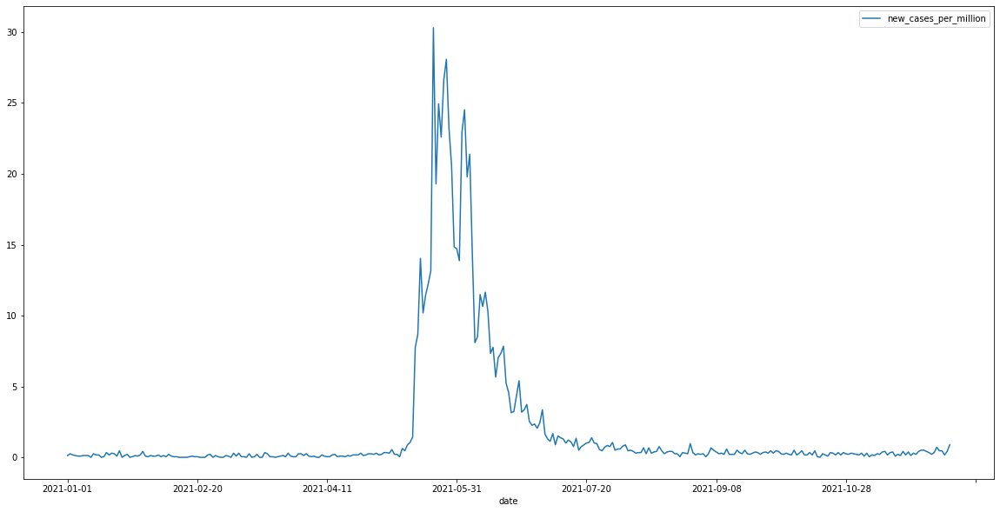

In [62]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
taiwan_df.plot(kind='line',x='date',y='new_cases_per_million', ax=ax)
plt.show()

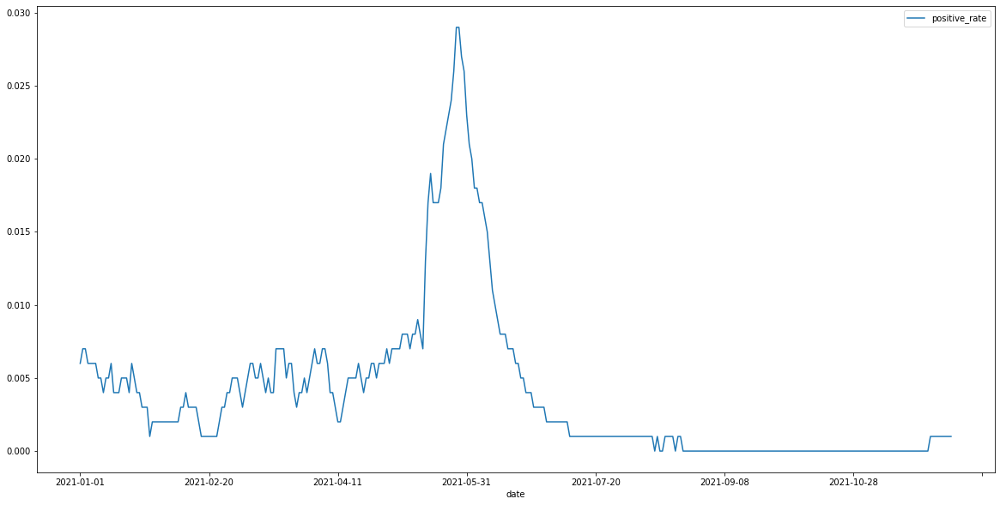

In [63]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
taiwan_df.plot(kind='line',x='date',y='positive_rate', ax=ax)
plt.show()

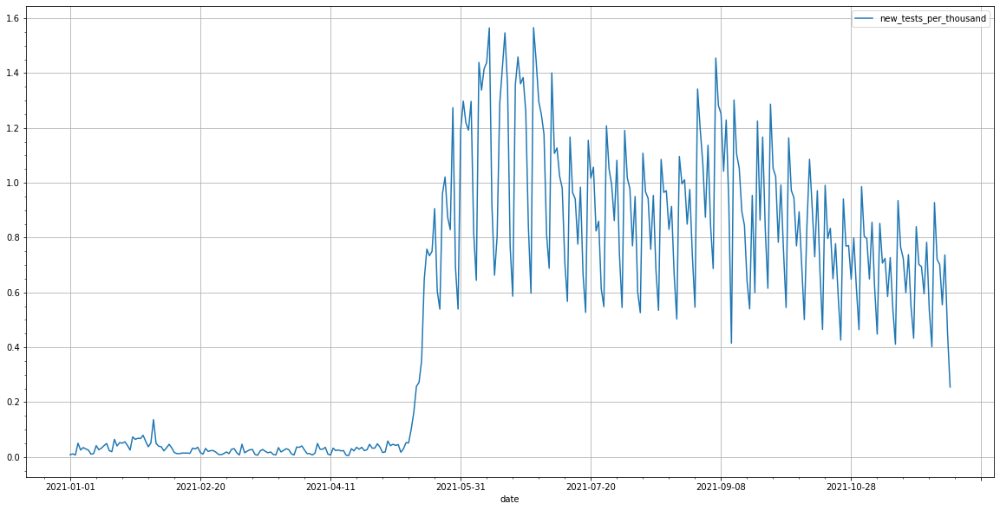

In [64]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
taiwan_df.plot(kind='line',x='date',y='new_tests_per_thousand', ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()


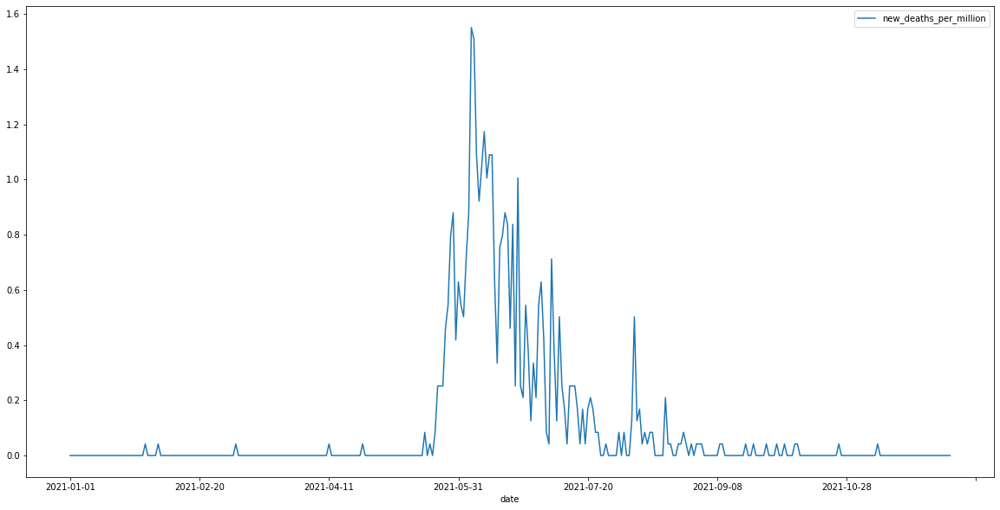

In [65]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
taiwan_df.plot(kind='line',x='date',y='new_deaths_per_million', ax=ax)
plt.show()

In [66]:
taiwan_df["DEATHPOS"] = (
    np.abs(taiwan_df["new_deaths_smoothed_per_million"] / (taiwan_df["positive_rate"] * 100 ))
)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



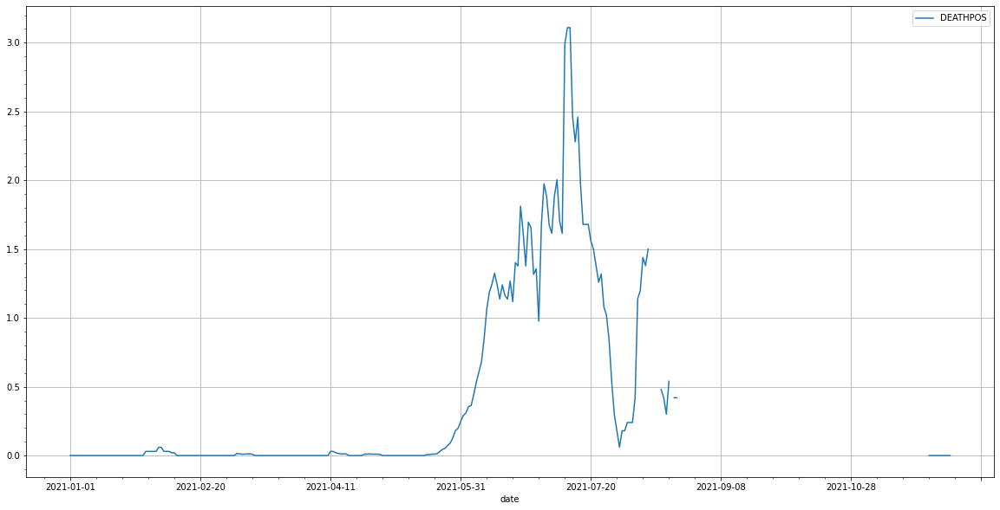

In [67]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
taiwan_df.plot(kind='line',x='date',y='DEATHPOS', ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()

**Japan**

In [68]:
japan_df = deaths_df[deaths_df['location']=='Japan']
japan_df

,location,date,new_cases_per_million,new_cases_smoothed_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,icu_patients_per_million,hosp_patients,hosp_patients_per_million,new_tests_per_thousand,new_tests_smoothed_per_thousand,positive_rate,total_boosters,new_vaccinations_smoothed,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed_per_hundred,population,aged_65_older,aged_70_older,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
63301,Japan,2021-01-01,25.831,27.780,0.389,0.401,NaN,NaN,NaN,0.199,0.260,0.107,NaN,NaN,NaN,NaN,NaN,NaN,NaN,126050796.0,27.049,18.493,5.72,11.2,33.7,NaN,13.05,84.63,0.919,NaN,NaN,NaN,NaN
63302,Japan,2021-01-02,24.363,26.858,0.246,0.383,NaN,NaN,NaN,0.069,0.233,0.115,NaN,NaN,NaN,NaN,NaN,NaN,NaN,126050796.0,27.049,18.493,5.72,11.2,33.7,NaN,13.05,84.63,0.919,NaN,NaN,NaN,NaN
63303,Japan,2021-01-03,25.117,27.109,0.476,0.406,NaN,NaN,NaN,0.161,0.243,0.112,NaN,NaN,NaN,NaN,NaN,NaN,NaN,126050796.0,27.049,18.493,5.72,11.2,33.7,NaN,13.05,84.63,0.919,NaN,NaN,NaN,NaN
63304,Japan,2021-01-04,26.521,28.181,0.381,0.402,NaN,NaN,NaN,0.669,0.254,0.111,NaN,NaN,NaN,NaN,NaN,NaN,NaN,126050796.0,27.049,18.493,5.72,11.2,33.7,NaN,13.05,84.63,0.919,NaN,NaN,NaN,NaN
63305,Japan,2021-01-05,39.262,29.680,0.603,0.422,NaN,NaN,NaN,0.702,0.326,0.091,NaN,NaN,NaN,NaN,NaN,NaN,NaN,126050796.0,27.049,18.493,5.72,11.2,33.7,NaN,13.05,84.63,0.919,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63637,Japan,2021-12-03,1.119,0.800,0.008,0.008,NaN,NaN,NaN,0.452,0.367,0.002,NaN,114219.0,NaN,NaN,NaN,906.0,0.023,126050796.0,27.049,18.493,5.72,11.2,33.7,NaN,13.05,84.63,0.919,NaN,NaN,NaN,NaN
63638,Japan,2021-12-04,0.952,0.800,0.000,0.007,NaN,NaN,NaN,0.219,0.353,0.002,NaN,107473.0,NaN,NaN,NaN,853.0,0.023,126050796.0,27.049,18.493,5.72,11.2,33.7,NaN,13.05,84.63,0.919,NaN,NaN,NaN,NaN
63639,Japan,2021-12-05,0.825,0.850,0.000,0.007,NaN,NaN,NaN,0.113,0.343,0.002,NaN,100727.0,79.28,77.50,NaN,799.0,0.023,126050796.0,27.049,18.493,5.72,11.2,33.7,NaN,13.05,84.63,0.919,NaN,NaN,NaN,NaN
63640,Japan,2021-12-06,0.428,0.825,0.008,0.007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,94433.0,79.31,77.57,NaN,749.0,0.023,126050796.0,27.049,18.493,5.72,11.2,33.7,NaN,13.05,84.63,0.919,NaN,NaN,NaN,NaN


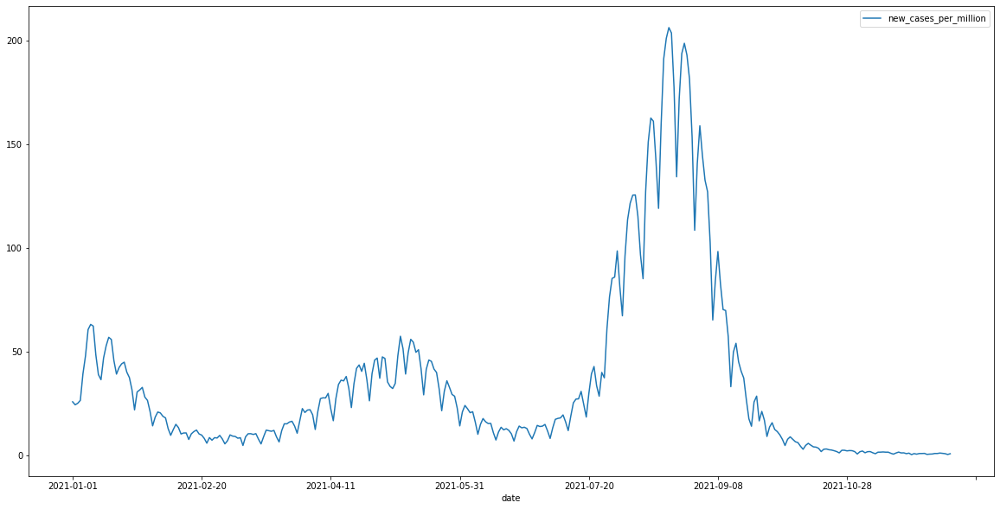

In [69]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
japan_df.plot(kind='line',x='date',y='new_cases_per_million', ax=ax)
plt.show()

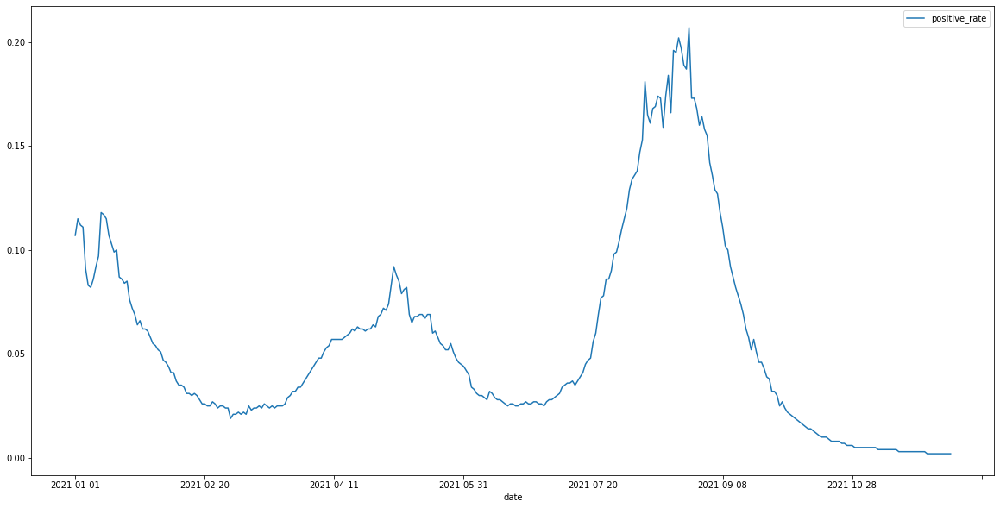

In [70]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
japan_df.plot(kind='line',x='date',y='positive_rate', ax=ax)
plt.show()

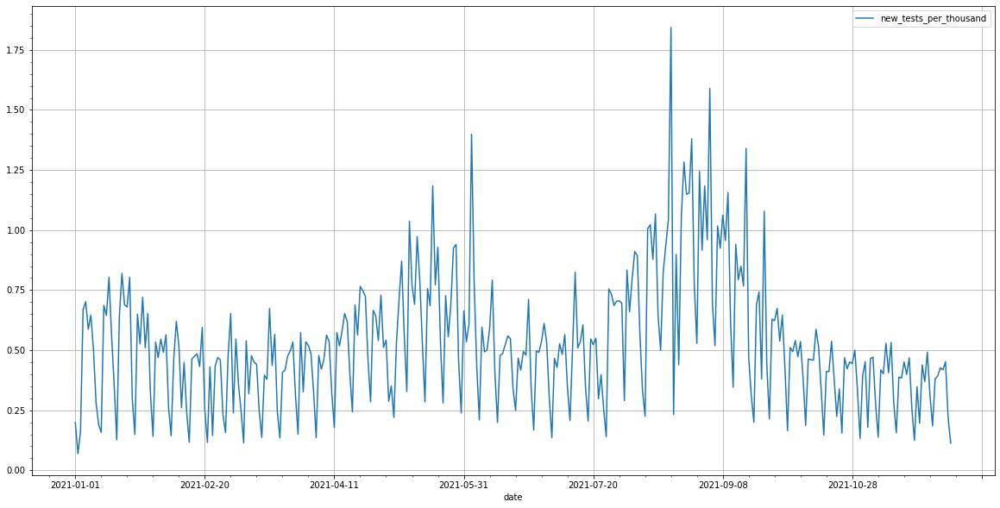

In [71]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
japan_df.plot(kind='line',x='date',y='new_tests_per_thousand', ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()


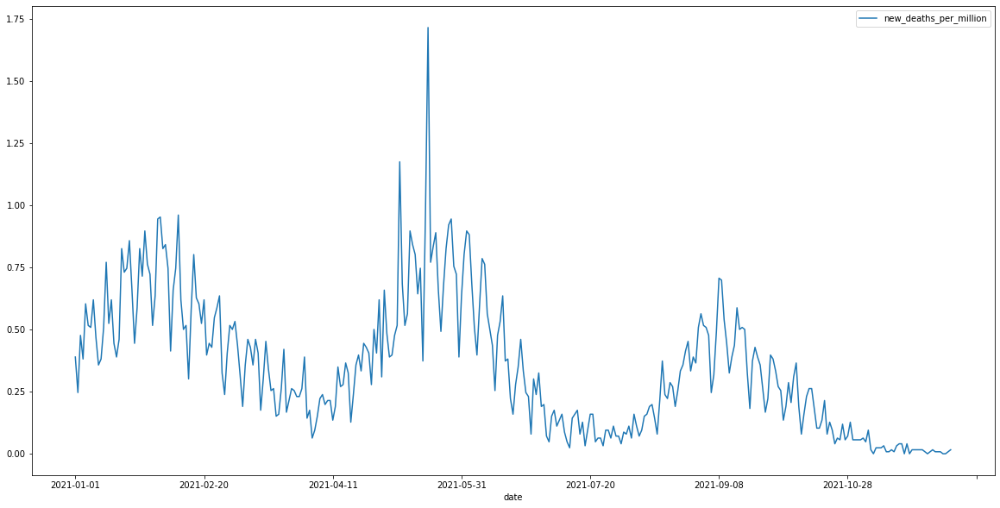

In [72]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
japan_df.plot(kind='line',x='date',y='new_deaths_per_million', ax=ax)
plt.show()

In [73]:
japan_df["DEATHPOS"] = (
    np.abs(japan_df["new_deaths_smoothed_per_million"] / (japan_df["positive_rate"] * 100 ))
)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



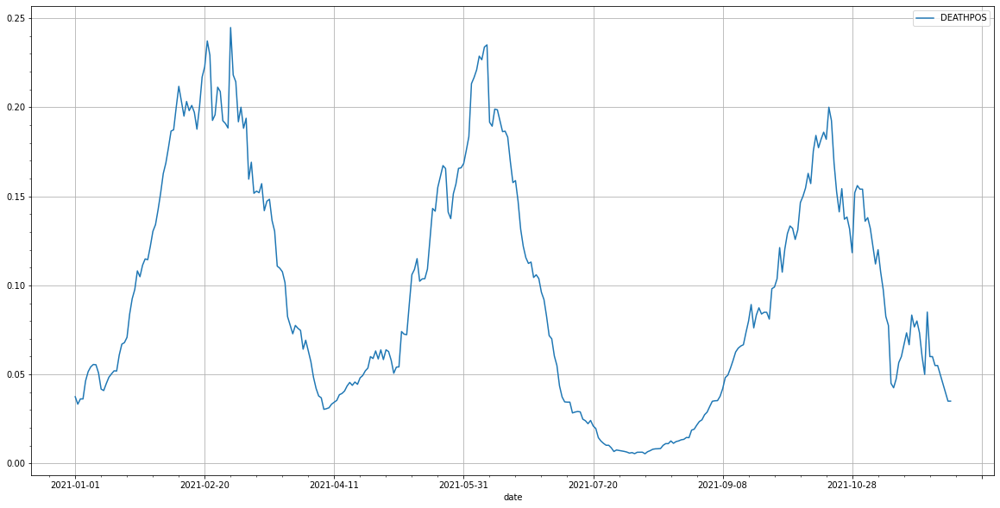

In [74]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
japan_df.plot(kind='line',x='date',y='DEATHPOS', ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()

**Korea**

In [75]:
korea_df = deaths_df[deaths_df['location']=='South Korea']
korea_df

,location,date,new_cases_per_million,new_cases_smoothed_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,icu_patients_per_million,hosp_patients,hosp_patients_per_million,new_tests_per_thousand,new_tests_smoothed_per_thousand,positive_rate,total_boosters,new_vaccinations_smoothed,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed_per_hundred,population,aged_65_older,aged_70_older,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
115721,South Korea,2021-01-01,16.061,18.631,0.487,0.415,NaN,NaN,NaN,0.952,0.863,0.022,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51305184.0,13.914,8.622,6.8,6.2,40.9,NaN,12.27,83.03,0.916,NaN,NaN,NaN,NaN
115722,South Korea,2021-01-02,12.689,17.743,0.390,0.429,NaN,NaN,NaN,0.605,0.866,0.020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51305184.0,13.914,8.622,6.8,6.2,40.9,NaN,12.27,83.03,0.916,NaN,NaN,NaN,NaN
115723,South Korea,2021-01-03,19.881,18.333,0.370,0.451,NaN,NaN,NaN,0.603,0.877,0.021,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51305184.0,13.914,8.622,6.8,6.2,40.9,NaN,12.27,83.03,0.916,171.8,0.06,-1.55,3.348589
115724,South Korea,2021-01-04,13.936,17.414,0.507,0.412,NaN,NaN,NaN,0.614,0.884,0.020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51305184.0,13.914,8.622,6.8,6.2,40.9,NaN,12.27,83.03,0.916,NaN,NaN,NaN,NaN
115725,South Korea,2021-01-05,16.353,16.832,0.390,0.412,NaN,NaN,NaN,1.164,0.887,0.019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51305184.0,13.914,8.622,6.8,6.2,40.9,NaN,12.27,83.03,0.916,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116057,South Korea,2021-12-03,200.662,86.148,2.027,0.883,NaN,NaN,NaN,NaN,NaN,NaN,3859996.0,237887.0,83.15,80.48,7.52,4637.0,0.047,51305184.0,13.914,8.622,6.8,6.2,40.9,NaN,12.27,83.03,0.916,NaN,NaN,NaN,NaN
116058,South Korea,2021-12-04,99.931,89.487,0.838,0.846,NaN,NaN,NaN,NaN,NaN,NaN,3956842.0,240840.0,83.19,80.59,7.71,4694.0,0.044,51305184.0,13.914,8.622,6.8,6.2,40.9,NaN,12.27,83.03,0.916,NaN,NaN,NaN,NaN
116059,South Korea,2021-12-05,84.280,92.327,0.799,0.872,NaN,NaN,NaN,NaN,NaN,NaN,3960545.0,241124.0,83.20,80.59,7.72,4700.0,0.044,51305184.0,13.914,8.622,6.8,6.2,40.9,NaN,12.27,83.03,0.916,NaN,NaN,NaN,NaN
116060,South Korea,2021-12-06,96.520,97.679,1.247,0.927,NaN,NaN,NaN,NaN,NaN,NaN,4249027.0,253773.0,83.30,80.72,8.28,4946.0,0.050,51305184.0,13.914,8.622,6.8,6.2,40.9,NaN,12.27,83.03,0.916,NaN,NaN,NaN,NaN


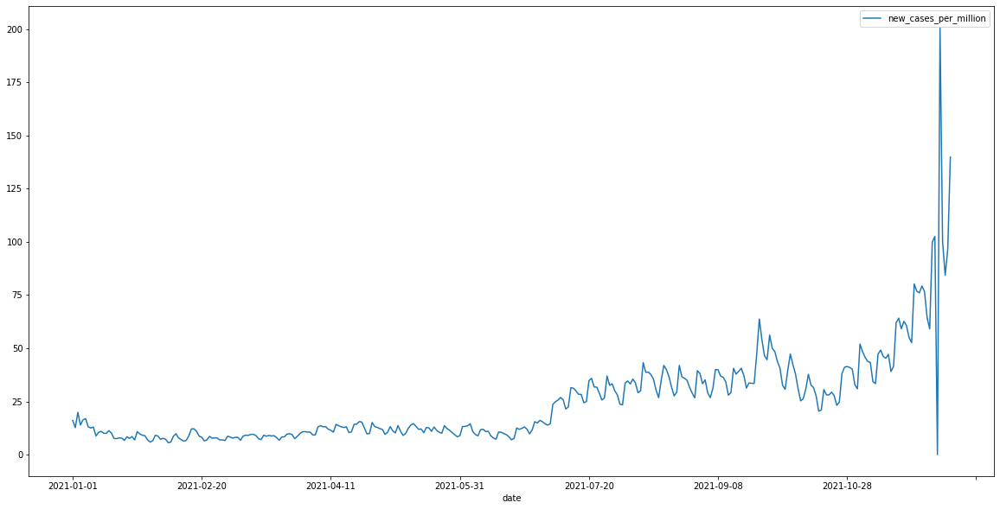

In [76]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
korea_df.plot(kind='line',x='date',y='new_cases_per_million', ax=ax)
plt.show()

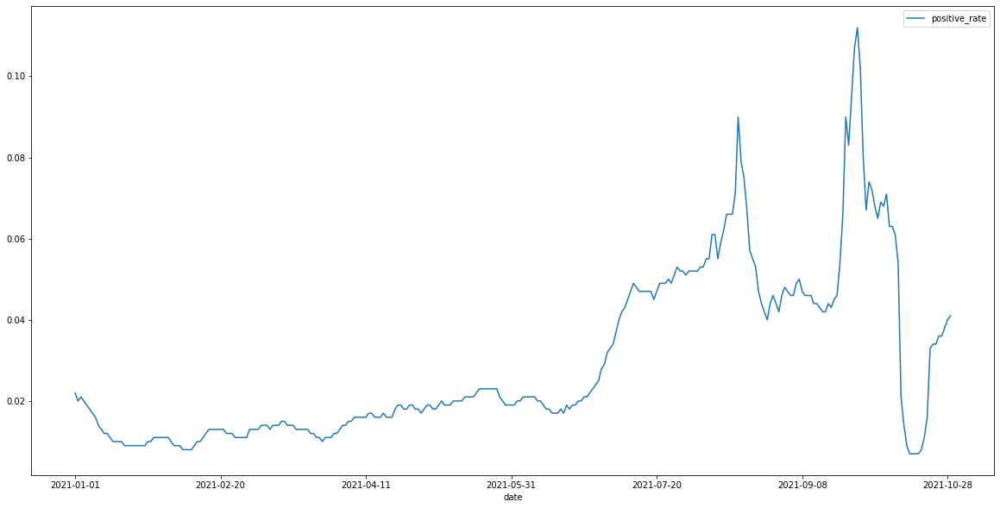

In [77]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
korea_df.plot(kind='line',x='date',y='positive_rate', ax=ax)
plt.show()

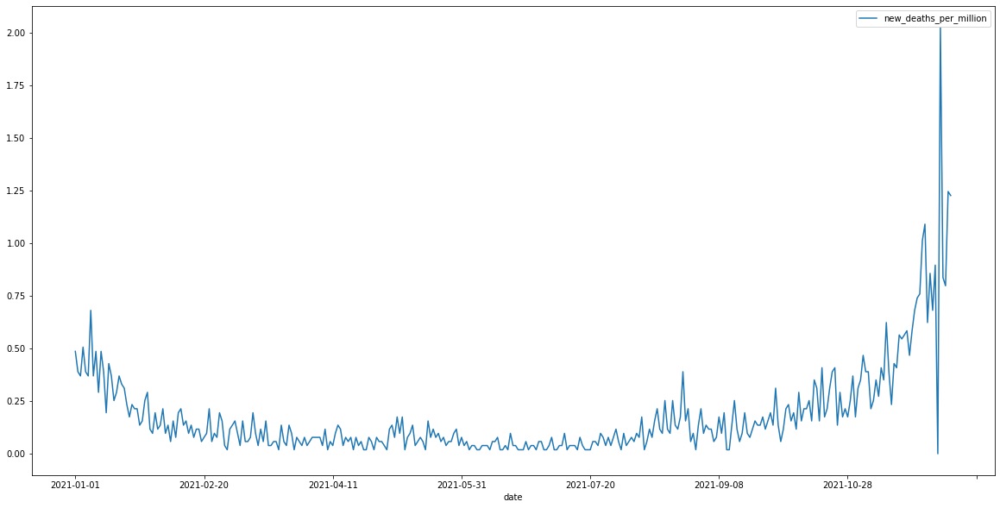

In [78]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
korea_df.plot(kind='line',x='date',y='new_deaths_per_million', ax=ax)
plt.show()

In [79]:
korea_df["DEATHPOS"] = (
    np.abs(korea_df["new_deaths_smoothed_per_million"] / (korea_df["positive_rate"] * 100 ))
)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



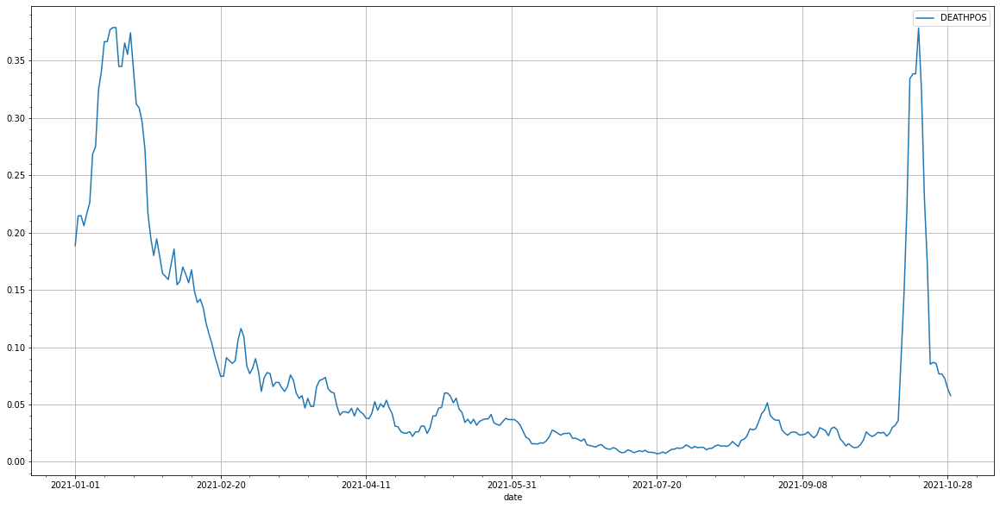

In [80]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
korea_df.plot(kind='line',x='date',y='DEATHPOS', ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()

**Sweden**

In [81]:
sweden_df = deaths_df[deaths_df['location']=='Sweden']
sweden_df

,location,date,new_cases_per_million,new_cases_smoothed_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,icu_patients_per_million,hosp_patients,hosp_patients_per_million,new_tests_per_thousand,new_tests_smoothed_per_thousand,positive_rate,total_boosters,new_vaccinations_smoothed,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed_per_hundred,population,aged_65_older,aged_70_older,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
119639,Sweden,2021-01-01,0.000,581.135,0.000,6.299,32.972,2901.0,285.527,2.876,3.014,0.193,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10160159.0,19.985,13.433,4.79,18.8,18.9,NaN,2.22,82.8,0.945,NaN,NaN,NaN,NaN
119640,Sweden,2021-01-02,0.000,581.135,0.000,6.299,32.874,2905.0,285.921,2.876,2.945,0.197,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10160159.0,19.985,13.433,4.79,18.8,18.9,NaN,2.22,82.8,0.945,NaN,NaN,NaN,NaN
119641,Sweden,2021-01-03,0.000,581.135,0.000,6.299,34.251,2949.0,290.251,2.876,2.876,0.202,NaN,NaN,0.02,NaN,NaN,NaN,NaN,10160159.0,19.985,13.433,4.79,18.8,18.9,NaN,2.22,82.8,0.945,7995.8,8.72,30.92,786.975873
119642,Sweden,2021-01-04,0.000,581.135,0.000,6.299,35.531,3004.0,295.665,2.999,2.894,0.201,NaN,9313.0,NaN,NaN,NaN,917.0,0.091,10160159.0,19.985,13.433,4.79,18.8,18.9,NaN,2.22,82.8,0.945,NaN,NaN,NaN,NaN
119643,Sweden,2021-01-05,3185.875,579.504,23.425,9.646,36.220,2996.0,294.877,2.999,2.911,0.199,NaN,9313.0,NaN,NaN,NaN,917.0,0.091,10160159.0,19.985,13.433,4.79,18.8,18.9,NaN,2.22,82.8,0.945,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119975,Sweden,2021-12-03,217.516,186.963,0.591,0.352,NaN,NaN,NaN,NaN,NaN,NaN,NaN,61824.0,74.91,70.66,NaN,6085.0,0.073,10160159.0,19.985,13.433,4.79,18.8,18.9,NaN,2.22,82.8,0.945,NaN,NaN,NaN,NaN
119976,Sweden,2021-12-04,0.000,186.963,0.000,0.352,NaN,NaN,NaN,NaN,NaN,NaN,NaN,62975.0,NaN,NaN,NaN,6198.0,0.073,10160159.0,19.985,13.433,4.79,18.8,18.9,NaN,2.22,82.8,0.945,NaN,NaN,NaN,NaN
119977,Sweden,2021-12-05,0.000,186.963,0.000,0.352,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64127.0,NaN,NaN,NaN,6312.0,0.073,10160159.0,19.985,13.433,4.79,18.8,18.9,NaN,2.22,82.8,0.945,NaN,NaN,NaN,NaN
119978,Sweden,2021-12-06,0.000,186.963,0.000,0.352,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65278.0,NaN,NaN,NaN,6425.0,0.073,10160159.0,19.985,13.433,4.79,18.8,18.9,NaN,2.22,82.8,0.945,NaN,NaN,NaN,NaN


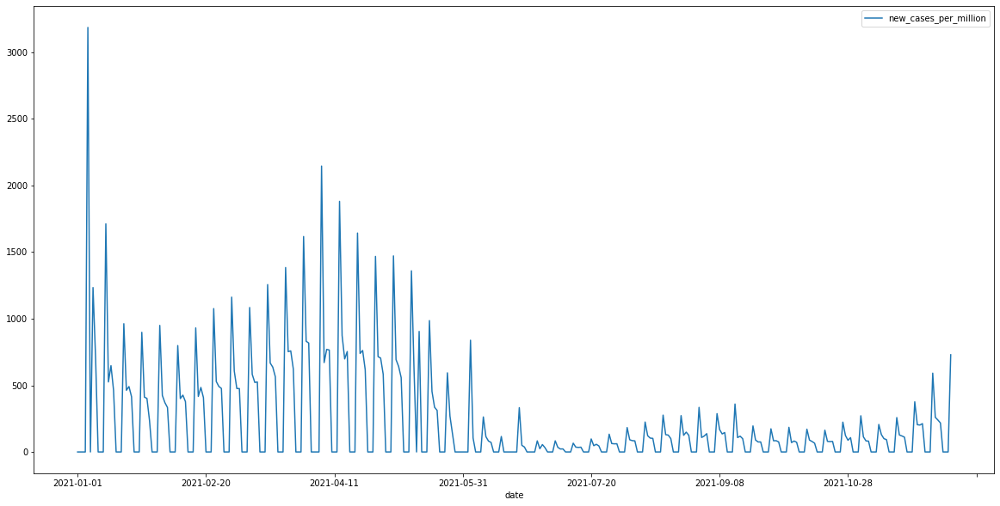

In [82]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
sweden_df.plot(kind='line',x='date',y='new_cases_per_million', ax=ax)
plt.show()

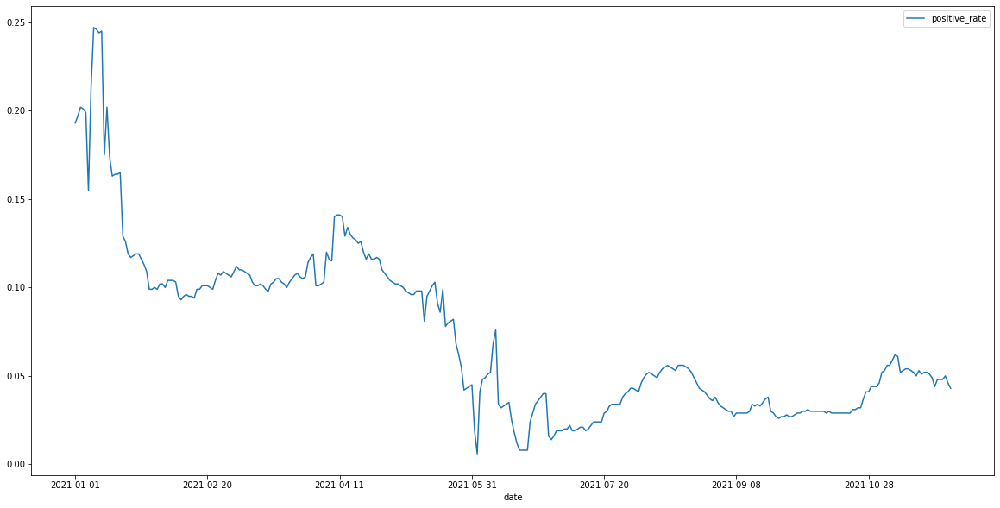

In [83]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
sweden_df.plot(kind='line',x='date',y='positive_rate', ax=ax)
plt.show()

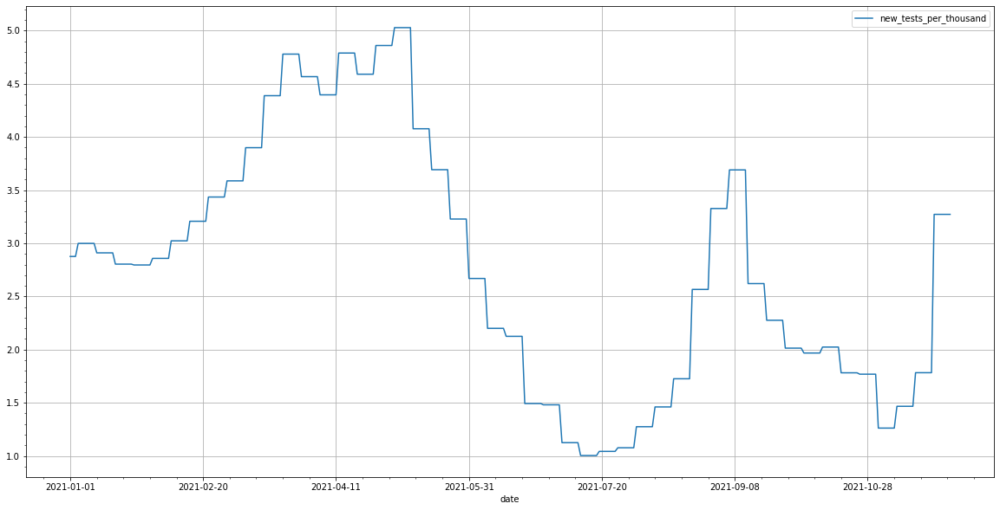

In [84]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
sweden_df.plot(kind='line',x='date',y='new_tests_per_thousand', ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()


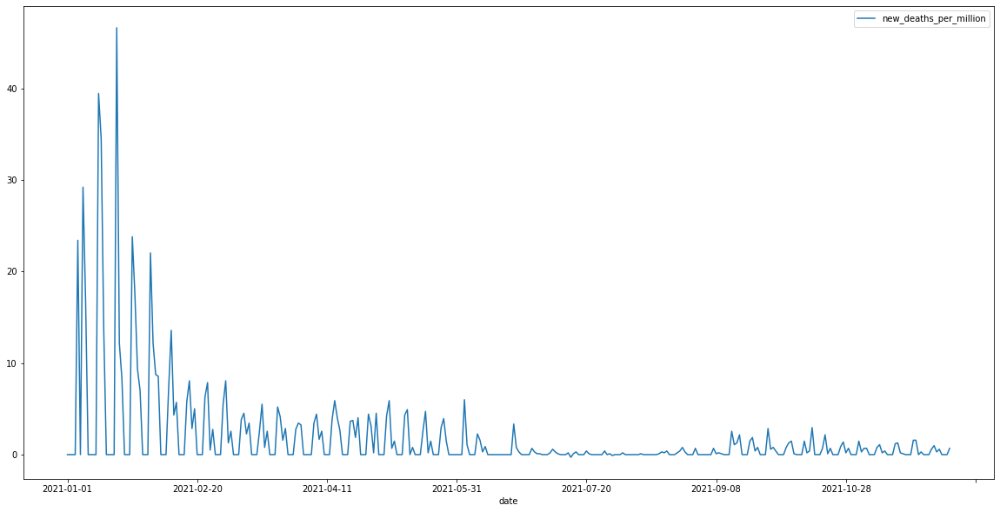

In [85]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
sweden_df.plot(kind='line',x='date',y='new_deaths_per_million', ax=ax)
plt.show()

In [86]:
sweden_df["DEATHPOS"] = (
    np.abs(sweden_df["new_deaths_smoothed_per_million"] / (sweden_df["positive_rate"] * 100 ))
)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



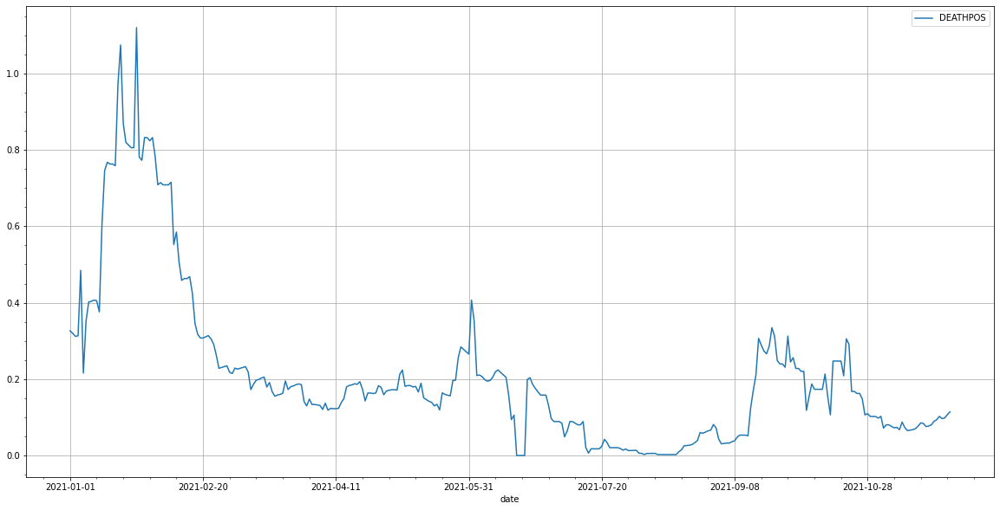

In [87]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
sweden_df.plot(kind='line',x='date',y='DEATHPOS', ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()

**Denmark**

In [88]:
denmark_df = deaths_df[deaths_df['location']=='Denmark']
denmark_df

,location,date,new_cases_per_million,new_cases_smoothed_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,icu_patients_per_million,hosp_patients,hosp_patients_per_million,new_tests_per_thousand,new_tests_smoothed_per_thousand,positive_rate,total_boosters,new_vaccinations_smoothed,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed_per_hundred,population,aged_65_older,aged_70_older,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
33307,Denmark,2021-01-01,421.619,408.939,4.128,4.620,22.190,885.0,152.237,5.508,13.221,0.031,NaN,NaN,0.60,0.00,NaN,NaN,0.085,5813302.0,19.677,12.325,6.41,19.3,18.8,NaN,2.5,80.9,0.94,NaN,NaN,NaN,NaN
33308,Denmark,2021-01-02,277.811,403.459,3.956,4.718,23.395,944.0,162.386,12.636,13.482,0.030,NaN,NaN,0.74,0.00,NaN,NaN,0.105,5813302.0,19.677,12.325,6.41,19.3,18.8,NaN,2.5,80.9,0.94,NaN,NaN,NaN,NaN
33309,Denmark,2021-01-03,202.295,378.590,4.989,4.915,23.395,937.0,161.182,11.288,13.444,0.028,NaN,NaN,0.83,0.00,NaN,NaN,0.104,5813302.0,19.677,12.325,6.41,19.3,18.8,NaN,2.5,80.9,0.94,-579.0,-1.03,15.06,-99.599161
33310,Denmark,2021-01-04,357.456,368.662,2.580,4.546,24.083,964.0,165.827,18.468,13.324,0.028,NaN,NaN,0.87,0.00,NaN,NaN,0.105,5813302.0,19.677,12.325,6.41,19.3,18.8,NaN,2.5,80.9,0.94,NaN,NaN,NaN,NaN
33311,Denmark,2021-01-05,343.522,352.861,5.333,4.767,24.255,942.0,162.042,18.161,13.021,0.027,NaN,NaN,1.08,0.00,NaN,NaN,0.115,5813302.0,19.677,12.325,6.41,19.3,18.8,NaN,2.5,80.9,0.94,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33643,Denmark,2021-12-03,799.030,774.210,2.580,1.892,NaN,NaN,NaN,32.309,31.053,0.025,940906.0,33422.0,78.87,76.83,16.19,5749.0,0.073,5813302.0,19.677,12.325,6.41,19.3,18.8,NaN,2.5,80.9,0.94,NaN,NaN,NaN,NaN
33644,Denmark,2021-12-04,743.983,788.487,2.064,1.868,NaN,NaN,NaN,23.933,31.155,0.025,958360.0,33944.0,78.97,76.87,16.49,5839.0,0.082,5813302.0,19.677,12.325,6.41,19.3,18.8,NaN,2.5,80.9,0.94,NaN,NaN,NaN,NaN
33645,Denmark,2021-12-05,541.173,757.991,1.204,1.818,NaN,NaN,NaN,NaN,NaN,NaN,972759.0,34466.0,79.13,76.90,16.73,5929.0,0.098,5813302.0,19.677,12.325,6.41,19.3,18.8,NaN,2.5,80.9,0.94,NaN,NaN,NaN,NaN
33646,Denmark,2021-12-06,1243.011,825.029,1.720,1.794,NaN,NaN,NaN,NaN,NaN,NaN,1006665.0,35848.0,79.26,76.97,17.32,6167.0,0.106,5813302.0,19.677,12.325,6.41,19.3,18.8,NaN,2.5,80.9,0.94,NaN,NaN,NaN,NaN


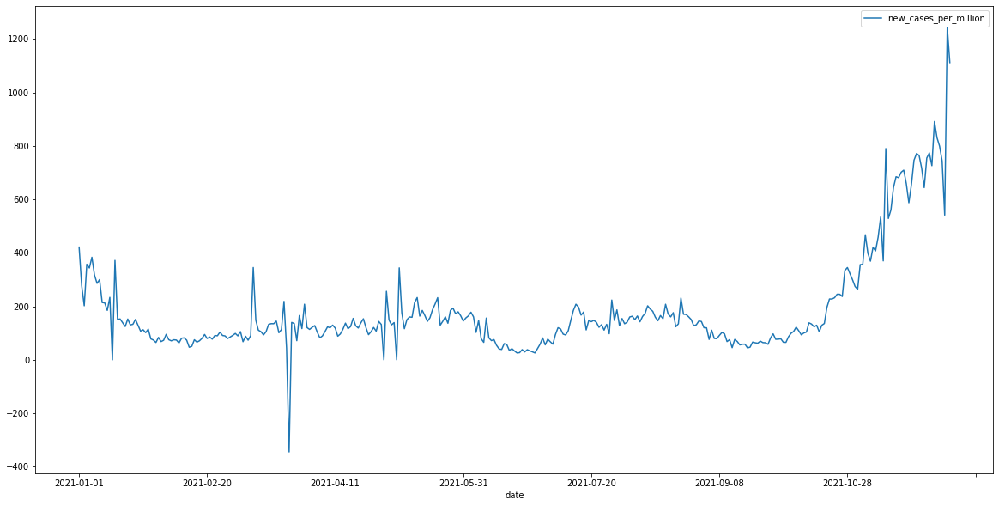

In [89]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
denmark_df.plot(kind='line',x='date',y='new_cases_per_million', ax=ax)
plt.show()

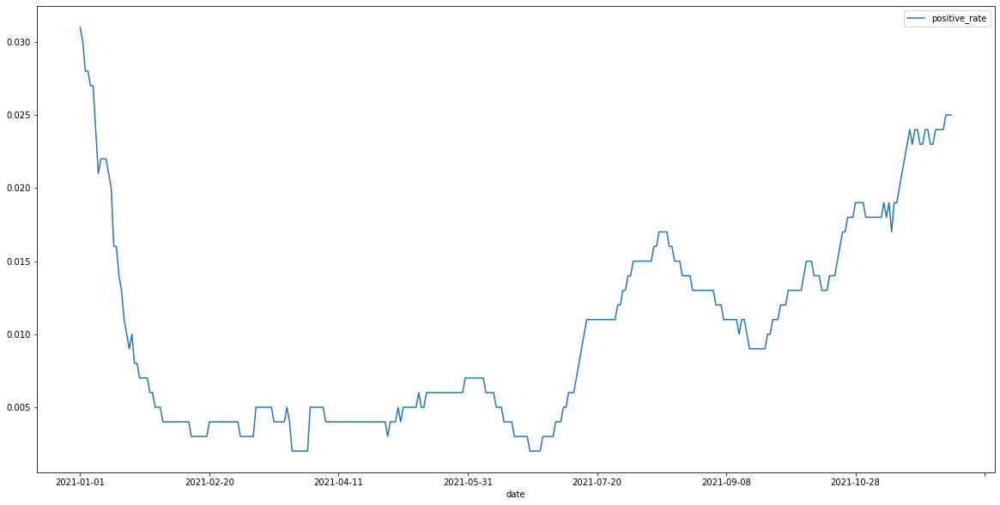

In [90]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
denmark_df.plot(kind='line',x='date',y='positive_rate', ax=ax)
plt.show()

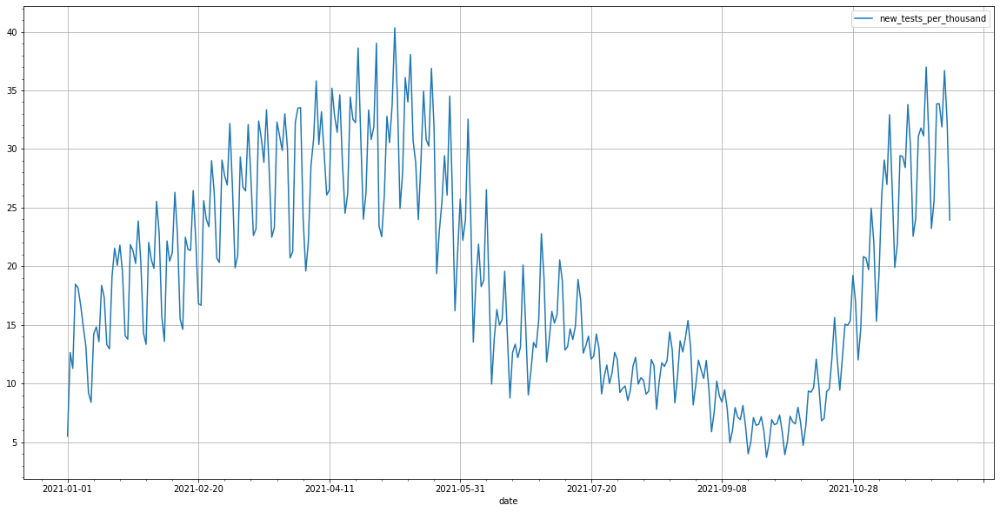

In [91]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
denmark_df.plot(kind='line',x='date',y='new_tests_per_thousand', ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()


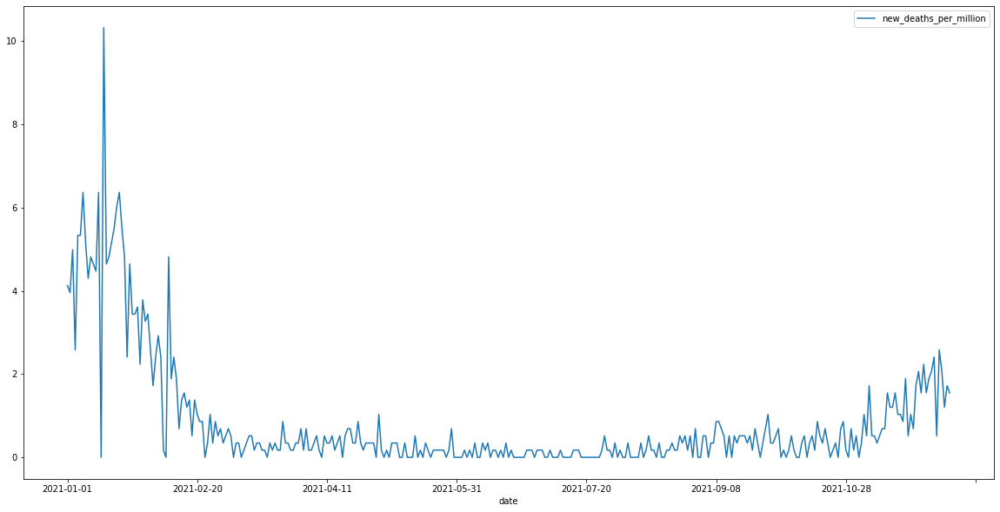

In [92]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
denmark_df.plot(kind='line',x='date',y='new_deaths_per_million', ax=ax)
plt.show()

In [93]:
denmark_df["DEATHPOS"] = (
    np.abs(denmark_df["new_deaths_smoothed_per_million"] / (denmark_df["positive_rate"] * 100 ))
)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



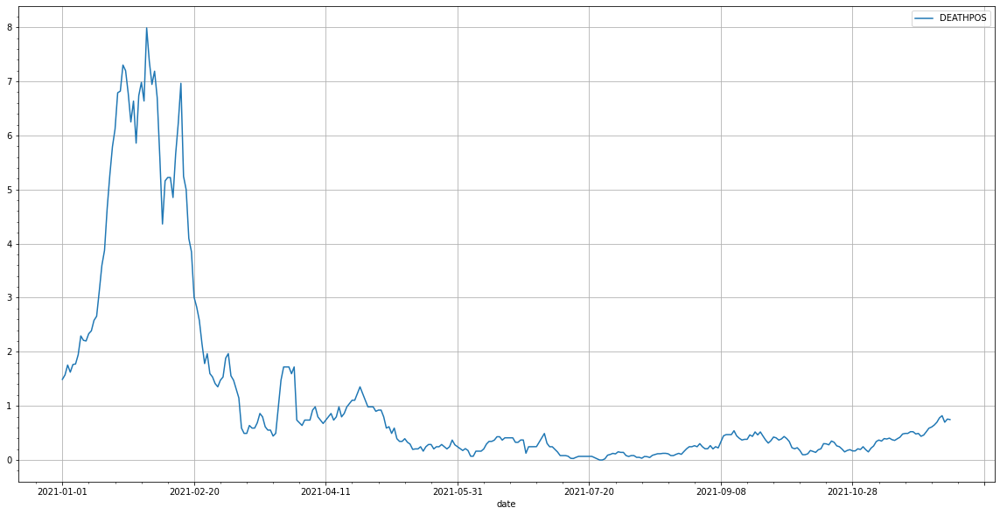

In [94]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
denmark_df.plot(kind='line',x='date',y='DEATHPOS', ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()

**United Kingdom**

In [95]:
uk_df = deaths_df[deaths_df['location']=='United Kingdom']
uk_df

,location,date,new_cases_per_million,new_cases_smoothed_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,icu_patients_per_million,hosp_patients,hosp_patients_per_million,new_tests_per_thousand,new_tests_smoothed_per_thousand,positive_rate,total_boosters,new_vaccinations_smoothed,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed_per_hundred,population,aged_65_older,aged_70_older,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
130352,United Kingdom,2021-01-01,783.760,673.876,9.017,8.242,31.698,26389.0,386.895,5.923,5.414,0.124,NaN,NaN,NaN,NaN,NaN,NaN,NaN,68207114.0,18.517,12.527,4.28,20.0,24.7,NaN,2.54,81.32,0.932,NaN,NaN,NaN,NaN
130353,United Kingdom,2021-01-02,848.196,722.185,6.524,8.732,33.076,27561.0,404.078,6.015,5.708,0.127,NaN,NaN,NaN,NaN,NaN,NaN,NaN,68207114.0,18.517,12.527,4.28,20.0,24.7,NaN,2.54,81.32,0.932,NaN,NaN,NaN,NaN
130354,United Kingdom,2021-01-03,808.669,769.654,6.671,8.958,35.480,29033.0,425.659,6.113,5.843,0.132,NaN,NaN,NaN,NaN,NaN,NaN,NaN,68207114.0,18.517,12.527,4.28,20.0,24.7,NaN,2.54,81.32,0.932,79912.3,12.96,24.58,1171.612392
130355,United Kingdom,2021-01-04,863.883,806.229,6.011,9.069,37.533,30775.0,451.199,6.772,6.075,0.133,NaN,NaN,NaN,NaN,NaN,NaN,NaN,68207114.0,18.517,12.527,4.28,20.0,24.7,NaN,2.54,81.32,0.932,NaN,NaN,NaN,NaN
130356,United Kingdom,2021-01-05,895.610,822.591,12.917,9.955,38.779,30686.0,449.894,7.132,6.416,0.128,NaN,NaN,NaN,NaN,NaN,NaN,NaN,68207114.0,18.517,12.527,4.28,20.0,24.7,NaN,2.54,81.32,0.932,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130688,United Kingdom,2021-12-03,750.376,654.385,2.141,1.755,13.195,7268.0,106.558,NaN,NaN,NaN,19825863.0,438074.0,74.87,68.16,29.07,6423.0,0.036,68207114.0,18.517,12.527,4.28,20.0,24.7,NaN,2.54,81.32,0.932,NaN,NaN,NaN,NaN
130689,United Kingdom,2021-12-04,609.526,658.029,1.862,1.747,NaN,NaN,NaN,NaN,NaN,NaN,20290479.0,439152.0,74.91,68.22,29.75,6439.0,0.037,68207114.0,18.517,12.527,4.28,20.0,24.7,NaN,2.54,81.32,0.932,NaN,NaN,NaN,NaN
130690,United Kingdom,2021-12-05,635.725,672.209,0.792,1.753,NaN,NaN,NaN,NaN,NaN,NaN,20580644.0,439582.0,74.95,68.26,30.17,6445.0,0.037,68207114.0,18.517,12.527,4.28,20.0,24.7,NaN,2.54,81.32,0.932,NaN,NaN,NaN,NaN
130691,United Kingdom,2021-12-06,758.660,690.791,0.674,1.776,NaN,NaN,NaN,NaN,NaN,NaN,20909809.0,440582.0,74.97,68.30,30.66,6459.0,0.037,68207114.0,18.517,12.527,4.28,20.0,24.7,NaN,2.54,81.32,0.932,NaN,NaN,NaN,NaN


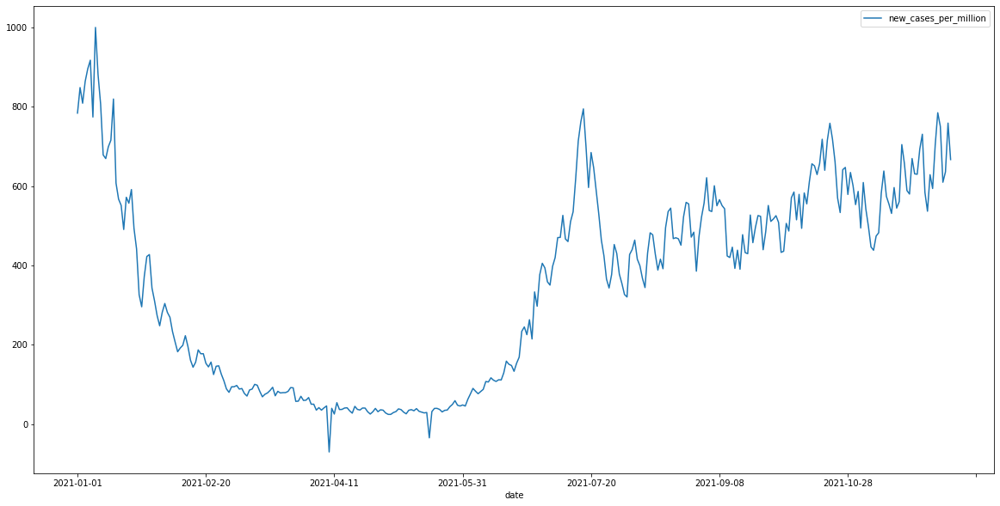

In [96]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
uk_df.plot(kind='line',x='date',y='new_cases_per_million', ax=ax)
plt.show()

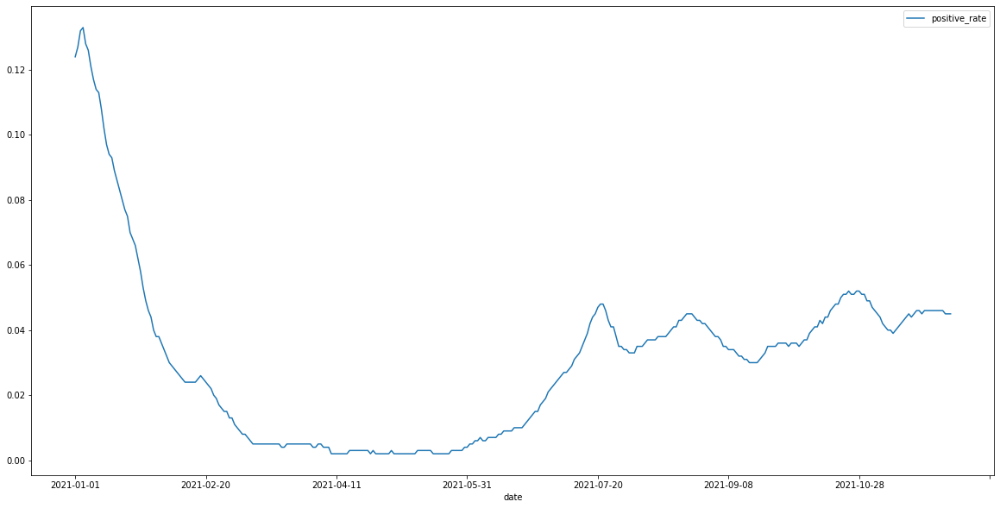

In [97]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
uk_df.plot(kind='line',x='date',y='positive_rate', ax=ax)
plt.show()

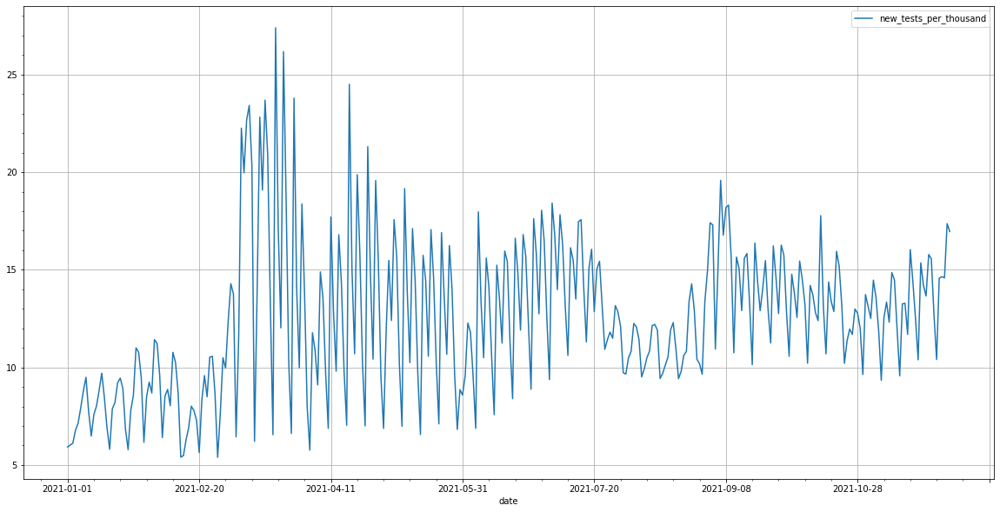

In [98]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
uk_df.plot(kind='line',x='date',y='new_tests_per_thousand', ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()


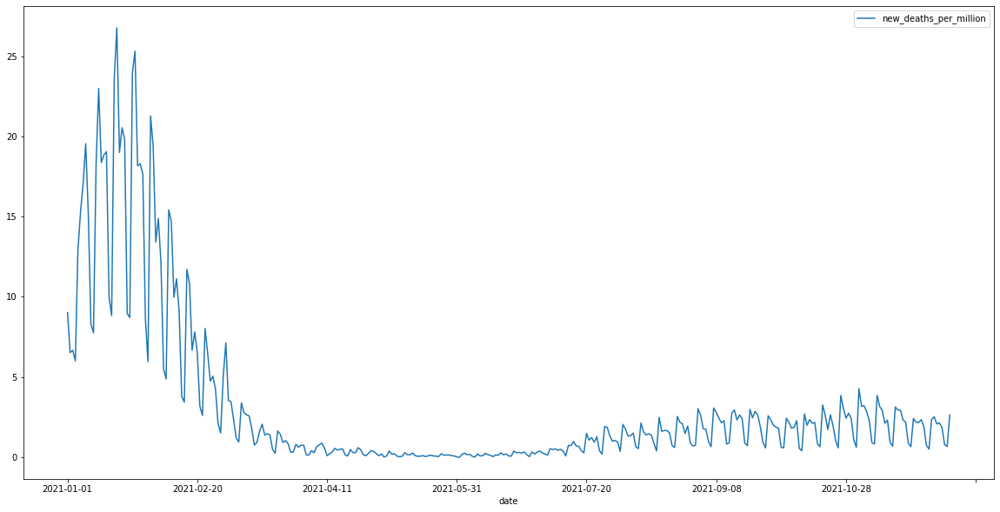

In [99]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
uk_df.plot(kind='line',x='date',y='new_deaths_per_million', ax=ax)
plt.show()

In [100]:
uk_df["DEATHPOS"] = (
    np.abs(uk_df["new_deaths_smoothed_per_million"] / (uk_df["positive_rate"] * 100 ))
)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



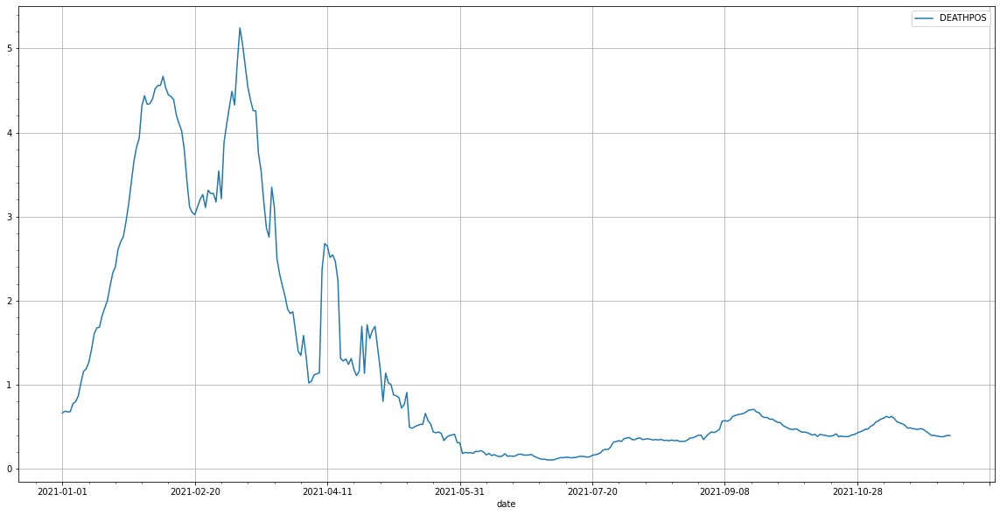

In [101]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
uk_df.plot(kind='line',x='date',y='DEATHPOS', ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()

**Israel**

In [102]:
israel_df = deaths_df[deaths_df['location']=='Israel']
israel_df

,location,date,new_cases_per_million,new_cases_smoothed_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,icu_patients_per_million,hosp_patients,hosp_patients_per_million,new_tests_per_thousand,new_tests_smoothed_per_thousand,positive_rate,total_boosters,new_vaccinations_smoothed,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed_per_hundred,population,aged_65_older,aged_70_older,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
61301,Israel,2021-01-01,564.848,524.609,3.337,2.614,24.217,1483.0,159.617,10.894,9.888,0.053,NaN,115885.0,11.44,0.00,NaN,12473.0,1.247,9291000.0,11.733,7.359,6.74,15.4,35.4,NaN,2.99,82.97,0.919,NaN,NaN,NaN,NaN
61302,Israel,2021-01-02,676.892,555.607,3.875,2.798,23.571,1512.0,162.738,8.305,10.091,0.055,NaN,121471.0,12.21,0.00,NaN,13074.0,1.307,9291000.0,11.733,7.359,6.74,15.4,35.4,NaN,2.99,82.97,0.919,NaN,NaN,NaN,NaN
61303,Israel,2021-01-03,725.756,616.142,2.583,2.921,27.446,1706.0,183.619,8.604,10.222,0.060,NaN,127923.0,13.82,0.00,NaN,13768.0,1.377,9291000.0,11.733,7.359,6.74,15.4,35.4,NaN,2.99,82.97,0.919,2791.5,5.97,13.87,300.45205
61304,Israel,2021-01-04,713.701,628.688,3.121,2.906,27.984,1735.0,186.740,12.018,10.403,0.060,NaN,130371.0,15.46,0.00,NaN,14032.0,1.403,9291000.0,11.733,7.359,6.74,15.4,35.4,NaN,2.99,82.97,0.919,NaN,NaN,NaN,NaN
61305,Israel,2021-01-05,857.389,672.556,5.489,3.137,29.383,1797.0,193.413,12.543,10.663,0.063,NaN,125923.0,16.81,0.00,NaN,13553.0,1.355,9291000.0,11.733,7.359,6.74,15.4,35.4,NaN,2.99,82.97,0.919,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61637,Israel,2021-12-03,44.667,54.461,0.000,0.261,8.288,161.0,17.329,10.415,9.601,0.006,4095194.0,12932.0,68.47,62.22,44.08,1392.0,0.089,9291000.0,11.733,7.359,6.74,15.4,35.4,NaN,2.99,82.97,0.919,NaN,NaN,NaN,NaN
61638,Israel,2021-12-04,38.640,54.753,0.000,0.231,7.965,156.0,16.790,4.560,9.712,0.006,4096006.0,12557.0,68.50,62.23,44.09,1352.0,0.086,9291000.0,11.733,7.359,6.74,15.4,35.4,NaN,2.99,82.97,0.919,NaN,NaN,NaN,NaN
61639,Israel,2021-12-05,50.909,56.968,0.538,0.231,8.072,167.0,17.974,10.259,9.838,0.006,4100589.0,12243.0,68.59,62.24,44.14,1318.0,0.083,9291000.0,11.733,7.359,6.74,15.4,35.4,NaN,2.99,82.97,0.919,NaN,NaN,NaN,NaN
61640,Israel,2021-12-06,81.261,56.798,0.538,0.215,7.965,170.0,18.297,NaN,NaN,NaN,4104723.0,11917.0,68.66,62.25,44.18,1283.0,0.080,9291000.0,11.733,7.359,6.74,15.4,35.4,NaN,2.99,82.97,0.919,NaN,NaN,NaN,NaN


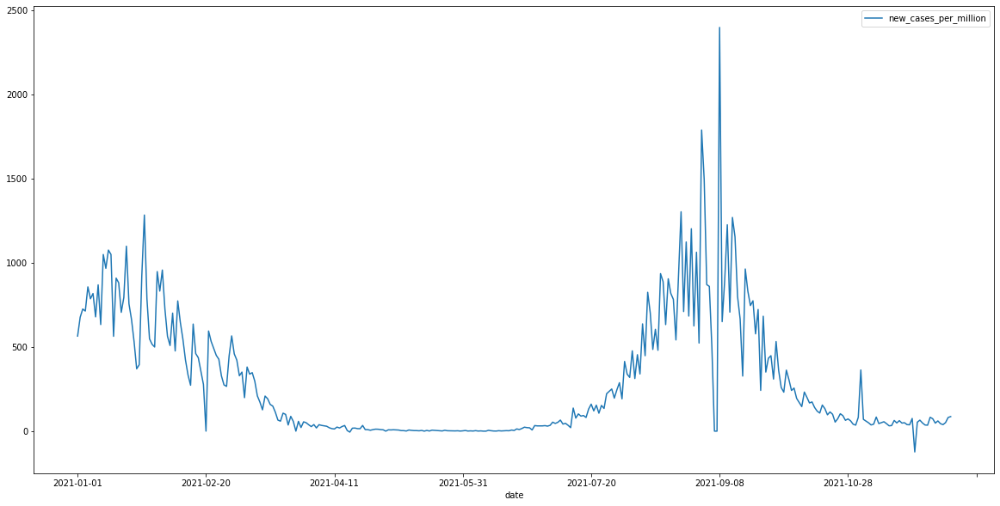

In [103]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
israel_df.plot(kind='line',x='date',y='new_cases_per_million', ax=ax)
plt.show()

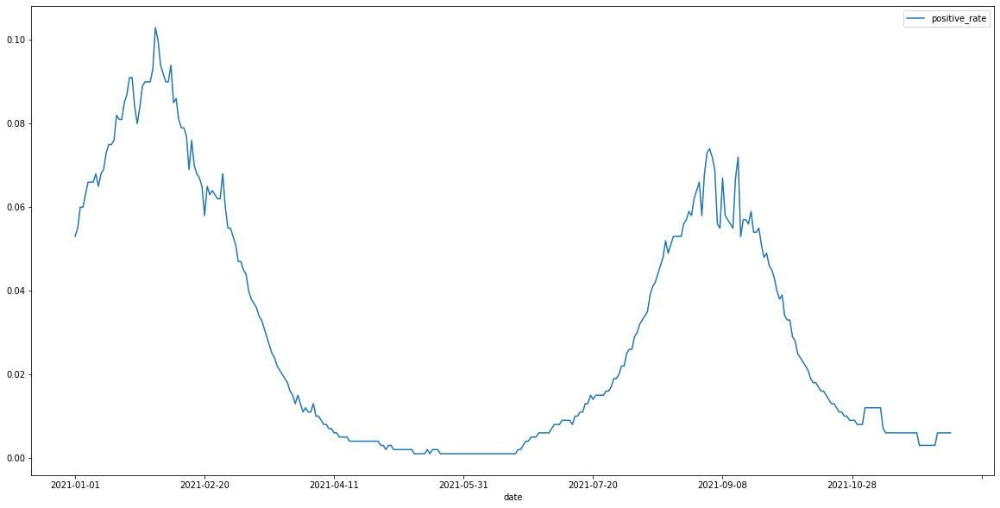

In [104]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
israel_df.plot(kind='line',x='date',y='positive_rate', ax=ax)
plt.show()

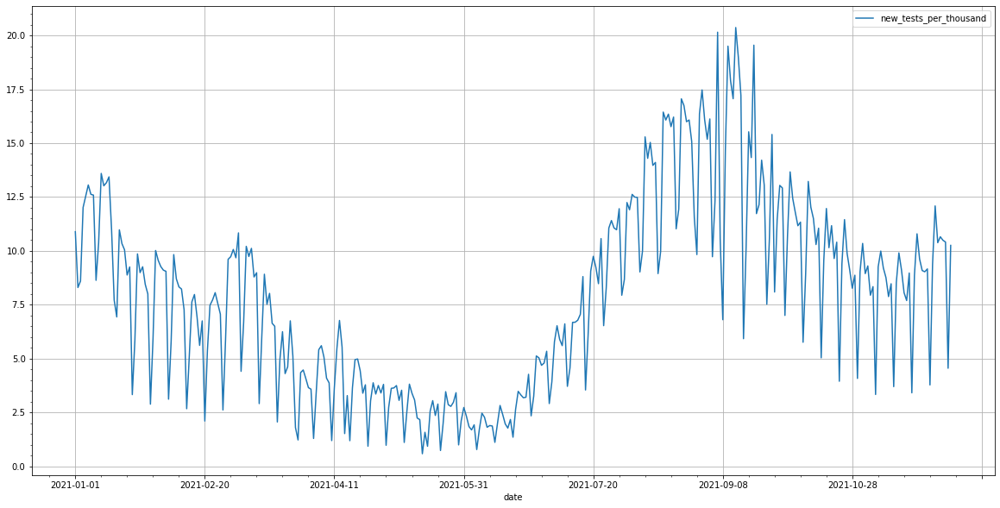

In [105]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
israel_df.plot(kind='line',x='date',y='new_tests_per_thousand', ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()


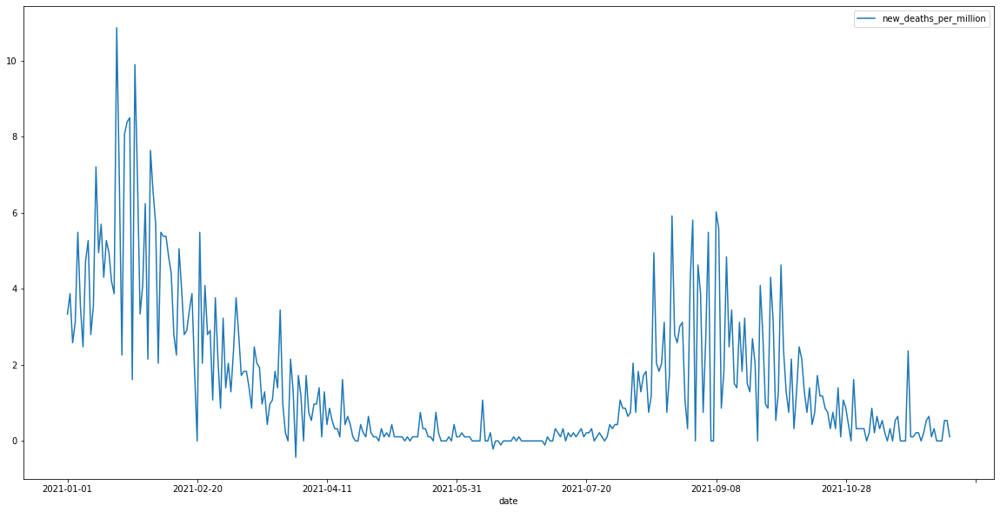

In [106]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
israel_df.plot(kind='line',x='date',y='new_deaths_per_million', ax=ax)
plt.show()

In [107]:
israel_df["DEATHPOS"] = (
    np.abs(israel_df["new_deaths_smoothed_per_million"] / (israel_df["positive_rate"] * 100 ))
)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



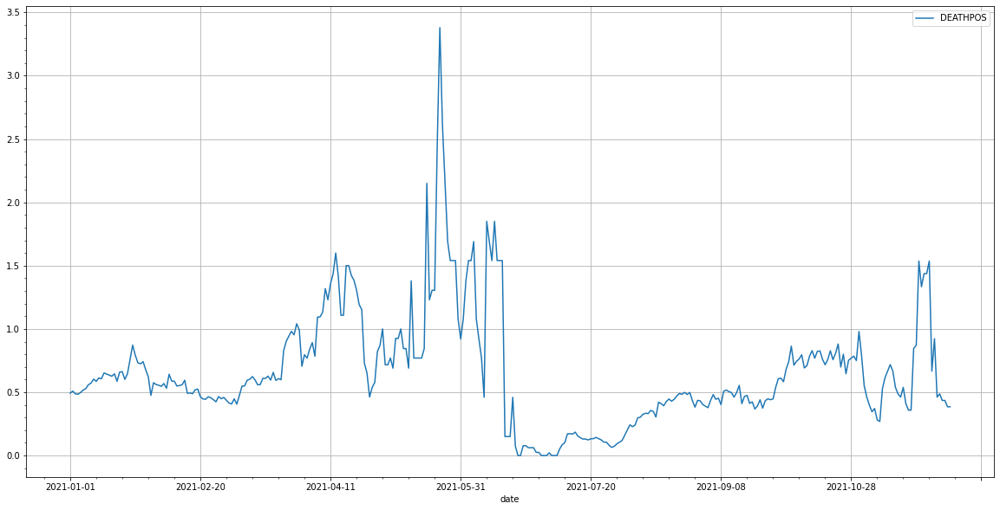

In [108]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
israel_df.plot(kind='line',x='date',y='DEATHPOS', ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()

**Ireland - vaccination data**


In [109]:
ire_vax_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 154 entries, 0 to 153
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   location                 154 non-null    object 
 1   date                     154 non-null    object 
 2   vaccine                  154 non-null    object 
 3   total_vaccinations       154 non-null    int64  
 4   source_url               154 non-null    object 
 5   people_vaccinated        140 non-null    float64
 6   people_fully_vaccinated  135 non-null    float64
 7   total_boosters           0 non-null      float64
dtypes: float64(3), int64(1), object(4)
memory usage: 9.8+ KB


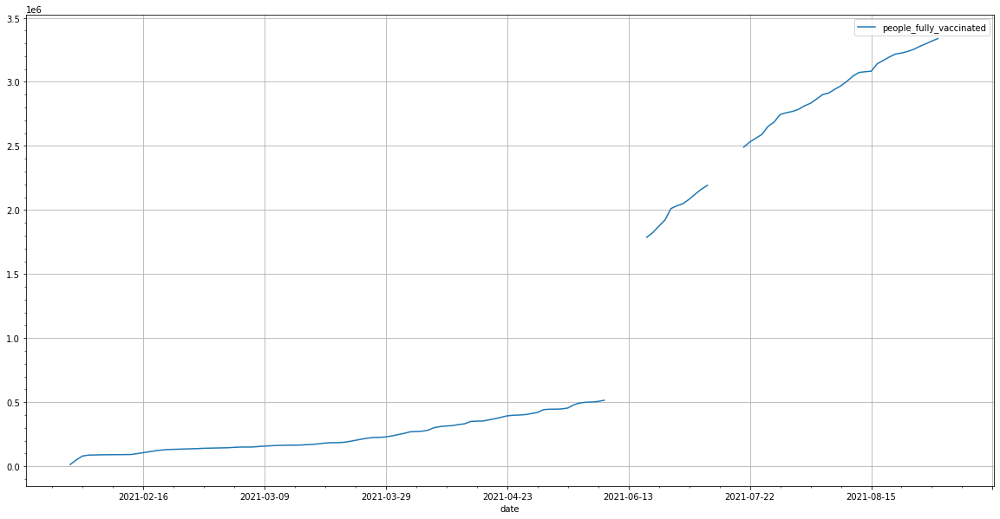

In [110]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
ire_vax_df.plot(kind='line',x='date',y='people_fully_vaccinated', ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()

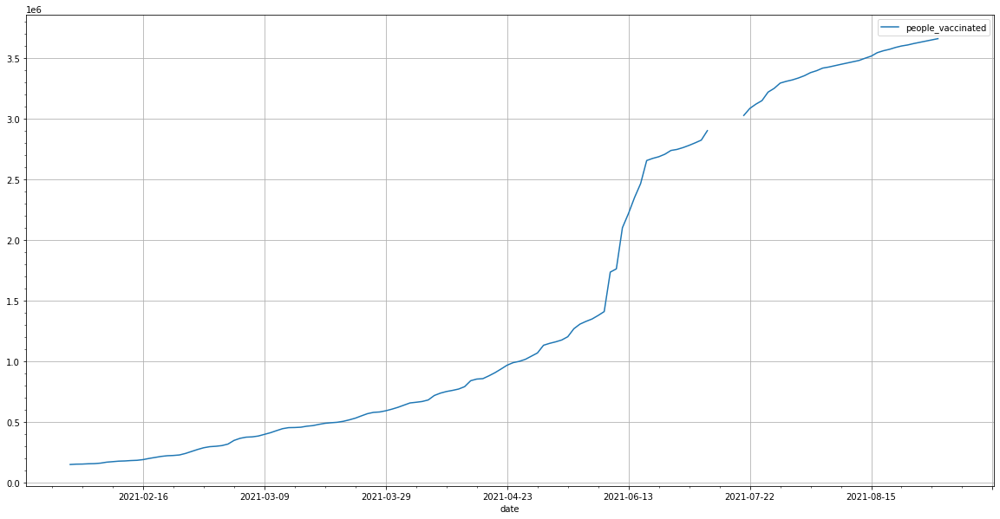

In [111]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
ire_vax_df.plot(kind='line',x='date',y='people_vaccinated', ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()

In [112]:
# Merging databases to get missing dates
#ire_vax_df = pd.merge(ire_vax_df, ireland_df, how="outer", on=["date"])
#ire_vax_df.head()

**ICU / POSSITIVITY RATE**

In [113]:
ireland_df["ICUPOS"] = (
    ireland_df["icu_patients_per_million"] / (ireland_df["positive_rate"] * 100 )
)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



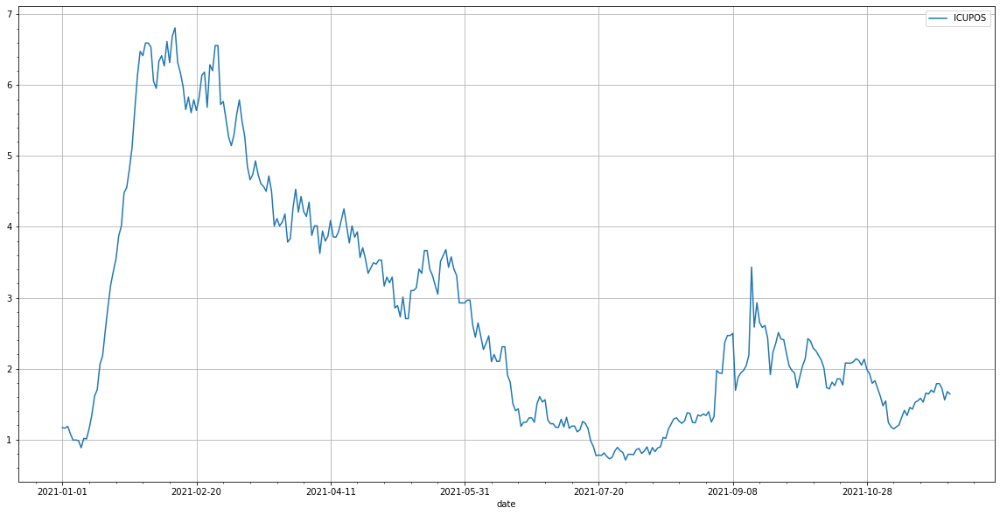

In [114]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
ireland_df.plot(kind='line',x='date',y='ICUPOS', ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()

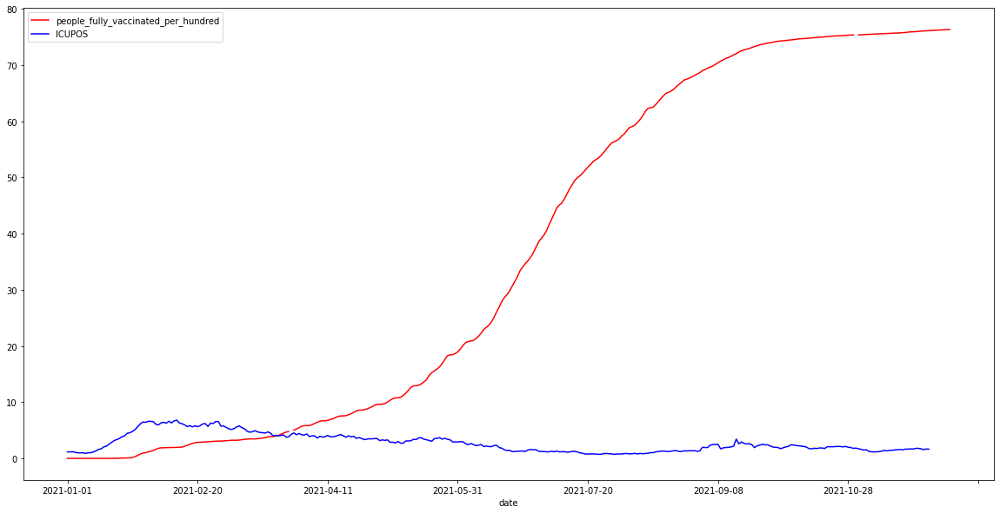

In [115]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)

ireland_df.plot(kind='line',x='date',y='people_fully_vaccinated_per_hundred', color='red', ax=ax)
ireland_df.plot(kind='line',x='date',y='ICUPOS', color='blue', ax=ax)

plt.show()

**Death to possitivity ratio**

In [116]:
ireland_df["DEATHPOS"] = (
    np.abs(ireland_df["new_deaths_smoothed_per_million"] / (ireland_df["positive_rate"] * 100 ))
)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



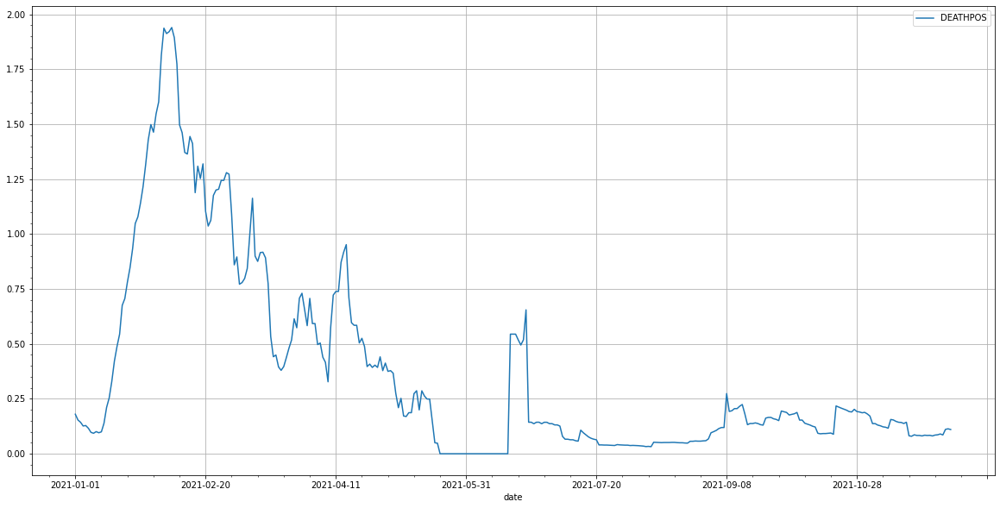

In [117]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
ireland_df.plot(kind='line',x='date',y='DEATHPOS', ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()

In [118]:
#Singling out an anomolny. Solved by switching to smoothed data.
anom_df = ireland_df[ireland_df['DEATHPOS']>8]
#anom_df = anom_df[anom_df['date']<'2021-08-14']
anom_df

,location,date,new_cases_per_million,new_cases_smoothed_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,icu_patients_per_million,hosp_patients,hosp_patients_per_million,new_tests_per_thousand,new_tests_smoothed_per_thousand,positive_rate,total_boosters,new_vaccinations_smoothed,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed_per_hundred,population,aged_65_older,aged_70_older,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million,ICUPOS,DEATHPOS


**Interpolating the vaccine data**

In [119]:
ire_vax_df.isna().sum() 

location                     0
date                         0
vaccine                      0
total_vaccinations           0
source_url                   0
people_vaccinated           14
people_fully_vaccinated     19
total_boosters             154
dtype: int64

In [120]:
# Fill in missing nan
ire_vax_df = ire_vax_df.interpolate()

In [121]:
ire_vax_df

,location,date,vaccine,total_vaccinations,source_url,people_vaccinated,people_fully_vaccinated,total_boosters
0,Ireland,2020-12-31,Pfizer/BioNTech,1800,https://twitter.com/RobOHanrahan/status/134493...,NaN,NaN,NaN
1,Ireland,2021-01-04,Pfizer/BioNTech,4000,https://www.thejournal.ie/covid-19-vaccine-rol...,NaN,NaN,NaN
2,Ireland,2021-01-07,Pfizer/BioNTech,15314,https://twitter.com/newschambers/status/134718...,NaN,NaN,NaN
3,Ireland,2021-01-10,Pfizer/BioNTech,40000,https://twitter.com/DonnellyStephen/status/134...,NaN,NaN,NaN
4,Ireland,2021-01-13,Pfizer/BioNTech,77303,https://covid19ireland-geohive.hub.arcgis.com/,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
149,Ireland,2021-08-25,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",6705120,https://covid19ireland-geohive.hub.arcgis.com/,3639176.0,3297241.0,NaN
150,Ireland,2021-08-26,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",6736217,https://covid19ireland-geohive.hub.arcgis.com/,3649203.0,3318661.0,NaN
151,Ireland,2021-08-27,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",6765355,https://covid19ireland-geohive.hub.arcgis.com/,3659200.0,3338217.0,NaN
152,Ireland,2021-08-28,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",6783387,https://covid19ireland-geohive.hub.arcgis.com/,3668868.5,3346851.0,NaN


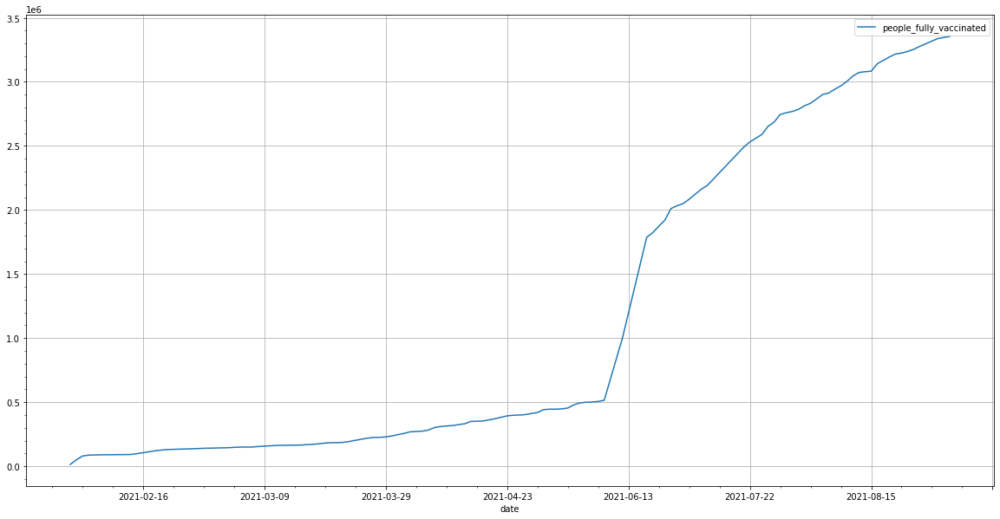

In [122]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
ire_vax_df.plot(kind='line',x='date',y='people_fully_vaccinated', ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()

In [123]:
june_ireland_df = ire_vax_df[ire_vax_df['date']=='2021-06-13']
june_ireland_df

,location,date,vaccine,total_vaccinations,source_url,people_vaccinated,people_fully_vaccinated,total_boosters
100,Ireland,2021-06-13,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",3218310,https://covid19.who.int/,2217448.0,1196725.0,NaN


**Data Preperation for tests**

In [124]:
tests_df = ireland_df[ireland_df['date']>'2021-02-11']
tests_df = tests_df[tests_df['date']<'2021-05-14']
tests_df = tests_df.fillna(0)
tests_df.tail(100)

,location,date,new_cases_per_million,new_cases_smoothed_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,icu_patients_per_million,hosp_patients,hosp_patients_per_million,new_tests_per_thousand,new_tests_smoothed_per_thousand,positive_rate,total_boosters,new_vaccinations_smoothed,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed_per_hundred,population,aged_65_older,aged_70_older,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million,ICUPOS,DEATHPOS
60365,Ireland,2021-02-12,184.431,170.784,3.813,6.995,34.719,959.0,192.458,3.781,3.358,0.051,0.0,4827.0,3.80,1.96,0.0,969.0,0.074,4982904.0,13.928,8.678,3.28,23.0,25.7,0.0,2.96,82.3,0.955,0.0,0.0,0.0,0.0,6.807647,1.371569
60366,Ireland,2021-02-13,215.938,179.127,13.245,7.368,34.117,898.0,180.216,3.647,3.320,0.054,0.0,4592.0,3.82,2.00,0.0,922.0,0.075,4982904.0,13.928,8.678,3.28,23.0,25.7,0.0,2.96,82.3,0.955,0.0,0.0,0.0,0.0,6.317963,1.364444
60367,Ireland,2021-02-14,157.739,172.418,3.412,7.511,32.110,899.0,180.417,2.900,3.293,0.052,0.0,4748.0,3.88,2.00,0.0,953.0,0.081,4982904.0,13.928,8.678,3.28,23.0,25.7,0.0,2.96,82.3,0.955,0.0,0.0,0.0,0.0,6.175000,1.444423
60368,Ireland,2021-02-15,164.563,172.160,0.000,7.483,31.708,916.0,183.829,2.298,3.258,0.053,0.0,5861.0,3.91,2.16,0.0,1176.0,0.084,4982904.0,13.928,8.678,3.28,23.0,25.7,0.0,2.96,82.3,0.955,0.0,0.0,0.0,0.0,5.982642,1.411887
60369,Ireland,2021-02-16,142.688,176.977,6.422,6.537,31.106,861.0,172.791,2.633,3.200,0.055,0.0,7149.0,4.03,2.32,0.0,1435.0,0.088,4982904.0,13.928,8.678,3.28,23.0,25.7,0.0,2.96,82.3,0.955,0.0,0.0,0.0,0.0,5.655636,1.188545
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60451,Ireland,2021-05-09,101.547,85.177,0.401,0.430,6.221,116.0,23.280,3.426,3.657,0.023,0.0,38763.0,28.61,10.88,0.0,7779.0,0.601,4982904.0,13.928,8.678,3.28,23.0,25.7,0.0,2.96,82.3,0.955,0.0,0.0,0.0,0.0,2.704783,0.186957
60452,Ireland,2021-05-10,76.261,83.113,0.000,0.430,6.221,124.0,24.885,2.713,3.661,0.023,0.0,41026.0,29.29,11.18,0.0,8233.0,0.624,4982904.0,13.928,8.678,3.28,23.0,25.7,0.0,2.96,82.3,0.955,0.0,0.0,0.0,0.0,2.704783,0.186957
60453,Ireland,2021-05-11,75.859,82.998,1.605,0.602,6.823,117.0,23.480,3.353,3.734,0.022,0.0,41989.0,29.92,11.60,0.0,8427.0,0.622,4982904.0,13.928,8.678,3.28,23.0,25.7,0.0,2.96,82.3,0.955,0.0,0.0,0.0,0.0,3.101364,0.273636
60454,Ireland,2021-05-12,89.506,83.887,1.605,0.631,6.823,109.0,21.875,3.940,3.738,0.022,0.0,43391.0,30.64,12.11,0.0,8708.0,0.618,4982904.0,13.928,8.678,3.28,23.0,25.7,0.0,2.96,82.3,0.955,0.0,0.0,0.0,0.0,3.101364,0.286818


In [125]:
tests_mean = (tests_df['new_tests_per_thousand'].mean())
tests_mean

3.219285714285715

In [126]:
# Taking every seventh row to make a mean for each day
df1 = tests_df[tests_df.reset_index().index % 7 == 0]
df2 = tests_df[tests_df.reset_index().index % 7 == 1]
df3 = tests_df[tests_df.reset_index().index % 7 == 2]
df4 = tests_df[tests_df.reset_index().index % 7 == 3]
df5 = tests_df[tests_df.reset_index().index % 7 == 4]
df6 = tests_df[tests_df.reset_index().index % 7 == 5]
df7 = tests_df[tests_df.reset_index().index % 7 == 6]

df1_mean = (df1['new_tests_per_thousand'].mean())
df2_mean = (df2['new_tests_per_thousand'].mean())
df3_mean = (df3['new_tests_per_thousand'].mean())
df4_mean = (df4['new_tests_per_thousand'].mean())
df5_mean = (df5['new_tests_per_thousand'].mean())
df6_mean = (df6['new_tests_per_thousand'].mean())
df7_mean = (df7['new_tests_per_thousand'].mean())

meanList = [df1_mean, df2_mean, df3_mean, df4_mean, df5_mean, df6_mean, df1_mean]


In [127]:
meanList

[3.5736923076923075,
 3.525461538461538,
 3.052923076923077,
 2.4464615384615387,
 2.8150769230769233,
 3.605692307692308,
 3.5736923076923075]

In [128]:
# example works
ireland_df2 = ireland_df.copy()
ireland_df2.loc[47545,9] = df1_mean

In [129]:
ireland_df2 = ireland_df.copy()
ireland_df2.loc[ireland_df.reset_index().index % 7 == 47545, 9] = df1_mean

In [130]:
# Inserting those values
ireland_df3 = ireland_df.copy()

ireland_df3[ireland_df3.reset_index().index % 7 == 47545]['new_tests_per_thousand'] = df1_mean
ireland_df3[ireland_df3.reset_index().index % 7 == 47546]['new_tests_per_thousand'] = df2_mean
ireland_df3[ireland_df3.reset_index().index % 7 == 47547]['new_tests_per_thousand'] = df3_mean
ireland_df3[ireland_df3.reset_index().index % 7 == 47548]['new_tests_per_thousand'] = df4_mean
ireland_df3[ireland_df3.reset_index().index % 7 == 47549]['new_tests_per_thousand'] = df5_mean
ireland_df3[ireland_df3.reset_index().index % 7 == 47550]['new_tests_per_thousand'] = df6_mean
ireland_df3[ireland_df3.reset_index().index % 7 == 47551]['new_tests_per_thousand'] = df7_mean

In [131]:
# Inserting those values
ireland_df3 = ireland_df.copy()

ireland_df3.iloc[ireland_df3.reset_index().index % 7 == 47546, 'new_tests_per_thousand'] = df2_mean
ireland_df3.iloc[ireland_df3.reset_index().index % 7 == 47547, 'new_tests_per_thousand'] = df3_mean
ireland_df3.iloc[ireland_df3.reset_index().index % 7 == 47548, 'new_tests_per_thousand'] = df4_mean
ireland_df3.iloc[ireland_df3.reset_index().index % 7 == 47549, 'new_tests_per_thousand'] = df5_mean
ireland_df3.iloc[ireland_df3.reset_index().index % 7 == 47550, 'new_tests_per_thousand'] = df6_mean
ireland_df3.iloc[ireland_df3.reset_index().index % 7 == 47551, 'new_tests_per_thousand'] = df7_mean


IndexError: ignored

In [ ]:
ireland_df3 = ireland_df.copy()

for i in ireland_df3:
  print(ireland_df3[i])
  if ireland_df3[i][0] >= 47545:
    ireland_df3.iloc[i][9] = random.choices(meanList)


In [ ]:
# Fill in missing nan
# Works
def testsMean(meanList):
   x = random.choices(meanList)
   print(x)
   return x

#ireland_df2['new_tests_per_thousand'] = ireland_df['new_tests_per_thousand'].fillna(tests_mean)
#ireland_df3['new_tests_per_thousand'] = ireland_df['new_tests_per_thousand'].fillna(method='ffill')
#ireland_df4['new_tests_per_thousand'] = ireland_df['new_tests_per_thousand'].fillna(testsMean(meanList))

In [ ]:
ax = plt.gca()
plt.rcParams["figure.figsize"] = (20,10)
ireland_df3.plot(kind='line',x='date',y='new_tests_per_thousand',ax=ax)
plt.grid()
ax.minorticks_on()
plt.show()